In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt

from mopet import mopet

from synchronization import plots
from synchronization import runner
from synchronization import constants
from synchronization import processing

# All-to-all PING model

* In this notebook we model two interconnected excitatory-inhibitory networks with all-to-all connectivity
* Gamma band activity is created by the PING mechanism
* Each neuron is subject to uncorrelated noise
* We explore the effect of noise strength on within and across network synchronization and try to extend Meng and Riecke's results to EI networks.

## Default Parameters

* Drive from E -> I needs to stay so low that I neurons do not burst!


In [2]:
params = {
    "J_itoi": 0.4,
    "J_etoe": 0.01,
    "J_etoi": 0.05,
    "J_itoe": 0.2,

    "J_ppee": 0.001,
    "J_ppei": 0.02,
    
    "p_ppee": 1.0,
    "p_ppei": 1.0,
    "p_ppii": 0.0,
    
    "p_etoi": 1.0,
    "p_etoe": 1.0,
    "p_itoe": 1.0,
    "p_itoi": 1.0,

    "ou_enabled": [False, False],

    "poisson_enabled": [True, True],
    "poisson_variance": 1.0,
    "poisson_p": 0.84,
    "poisson_size": 800,
    "poisson_mean_input": 300,
    "poisson_I_ratio": 0.4,
    "poisson_I_enabled": True,
    
    "N_pop": 2,
    
    "net_record_spikes": 400,
    "const_delay": 0.0,
}

## **State 1** - All-to-all PING model

Weak noise and weak inter-network coupling.

Unsynchronized activity across and synchronized activity within networks.

In [3]:
params_mid = dict(params)
params_mid.update({
    "runtime": 5000,
})

model = runner.run(
    modified_params=params_mid,
    file_name="PING_all_to_all",
    load=True
)

Global Order Parameter value of: 0.5817476694423319
Mean Phase Coherence 0.1941452764452131
Computing within synchronization for network 1 and 2
Within Synchronization of Network 1 0.8575382436478852
Within Synchronization of Network 2 0.8188472475490097


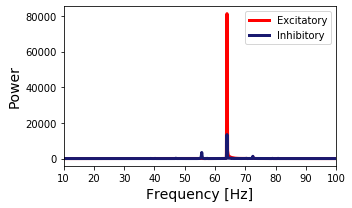

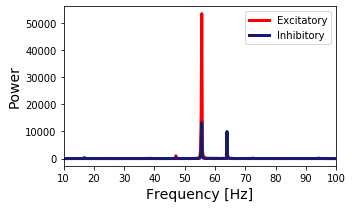

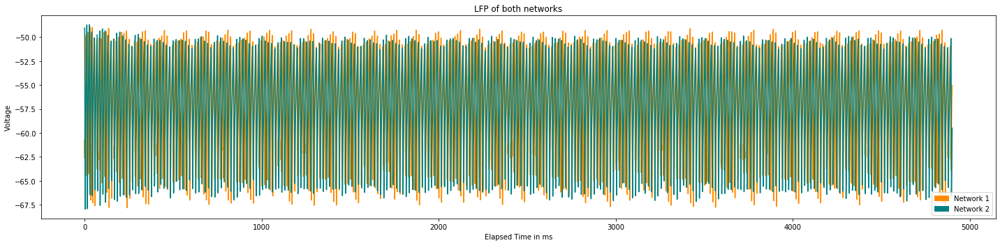

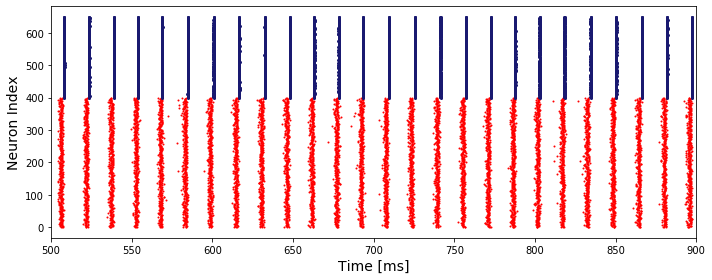

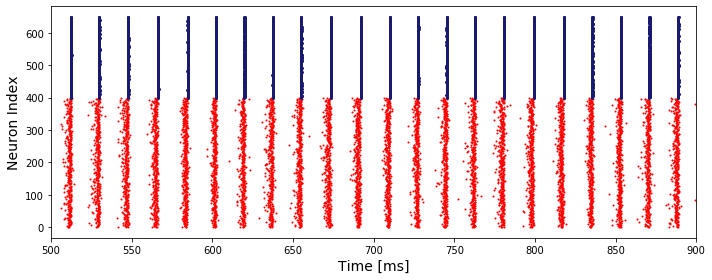

...

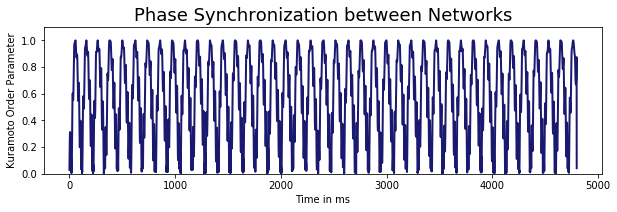

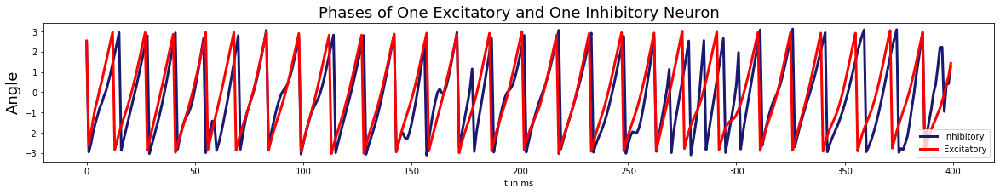

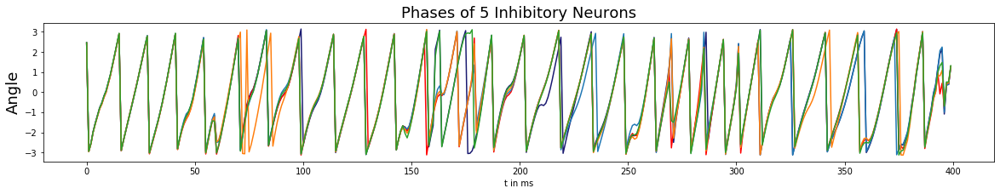

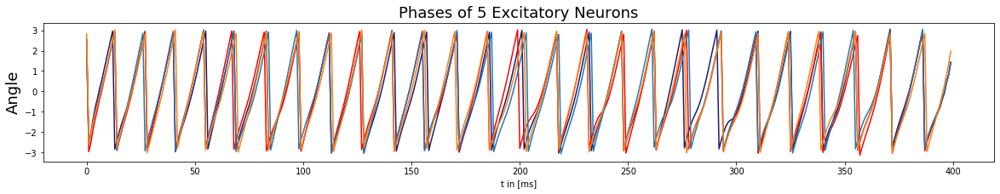

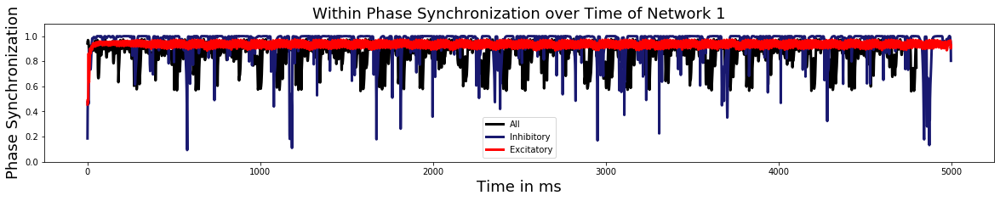

In [11]:
plots.plot_results(model, pop_rates=True, full_raster=False, x_max_psd=100, folder="PING_a2a_weak_noise", save=True, phase_analysis=True)

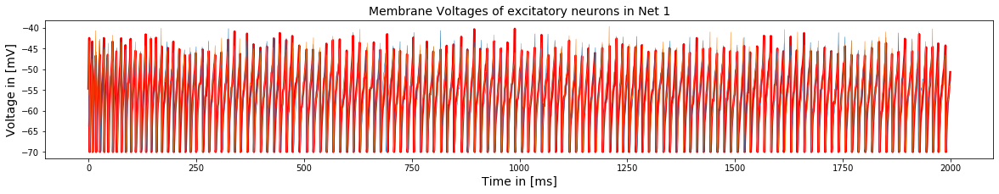

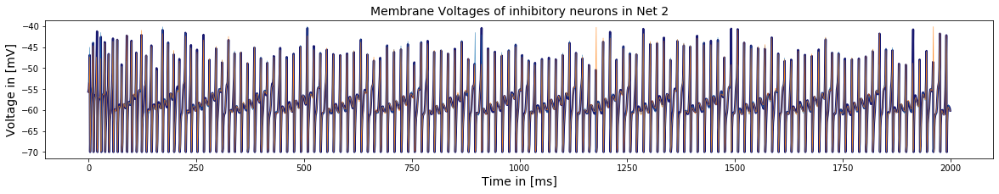

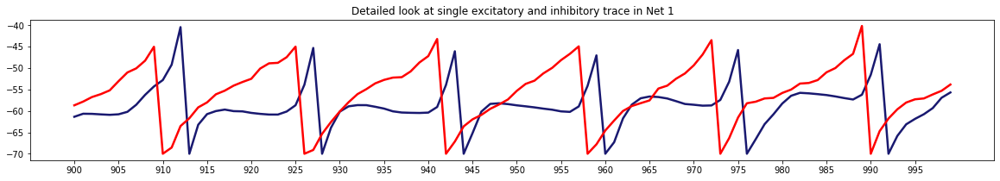

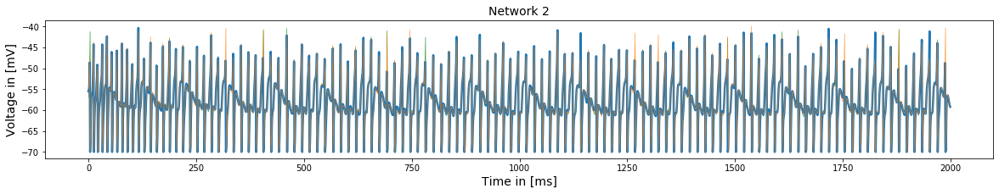

In [13]:
plots.membrane_potentials_sample(model)

0
250


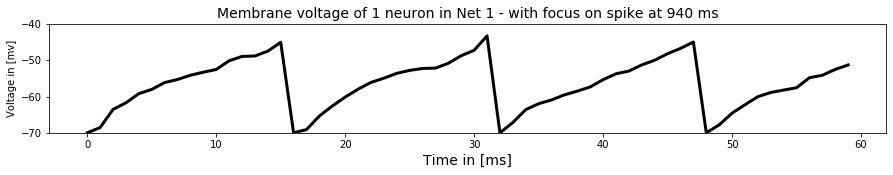

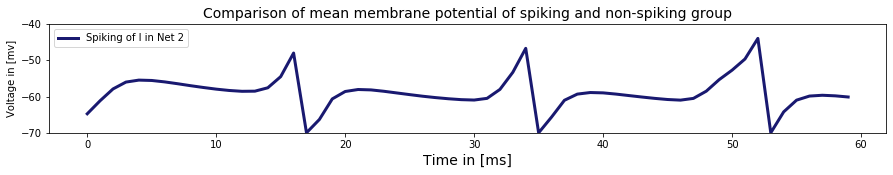

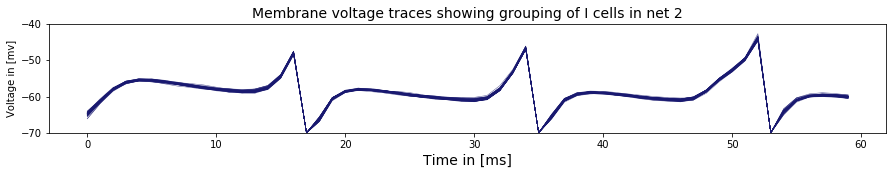

In [19]:
window=(910, 970)

v_e = model["v_all_neurons_e"]
v2 = model["v_all_neurons_i2"]

plots.spike_variability_analysis(v_e, v2, window=window, t_s=940, t_width=(3, 3))

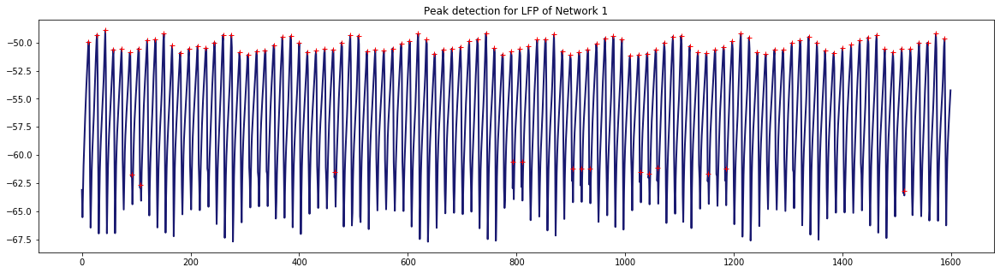

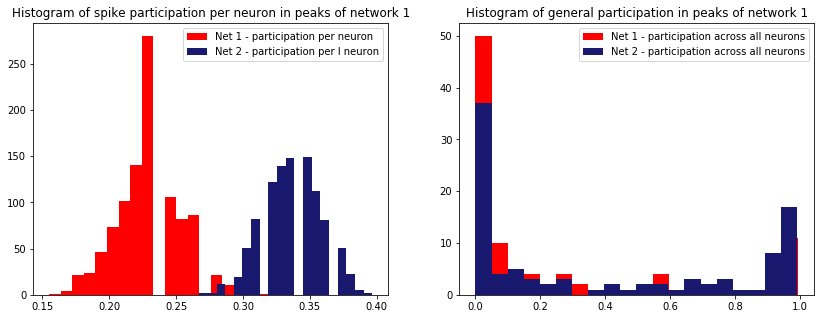

In [23]:
plots.spike_participation_histograms(model)

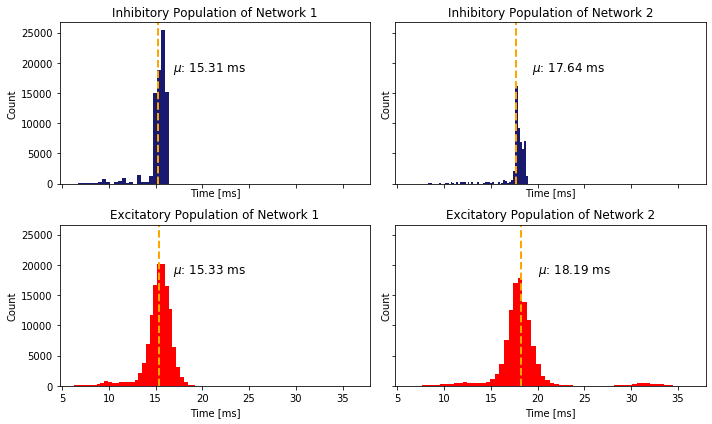

In [5]:
plots.isi_histograms(model, filter_outlier=True, folder="PING_all_to_all", key="normal")

## **State 2** - Increase in E to I network coupling strength leads to synchronization 

Synchronized activity across and synchronized activity within networks

In [6]:
params_mid = dict(params)
params_mid.update({
    "J_ppee": 0.01,
    "J_ppei": 0.05,
    "runtime": 5000
})

model = runner.run(
    modified_params=params_mid,
    file_name="PING_all_to_all_coupling",
    load=True
)

Global Order Parameter value of: 0.9726014636342744
Mean Phase Coherence 0.9942808539777422
Computing within synchronization for network 1 and 2
Within Synchronization of Network 1 0.8686934396323654
Within Synchronization of Network 2 0.5176309433951675


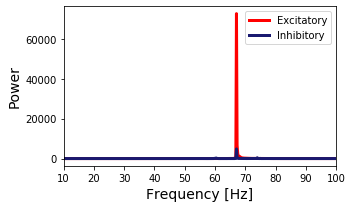

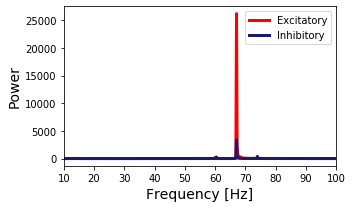

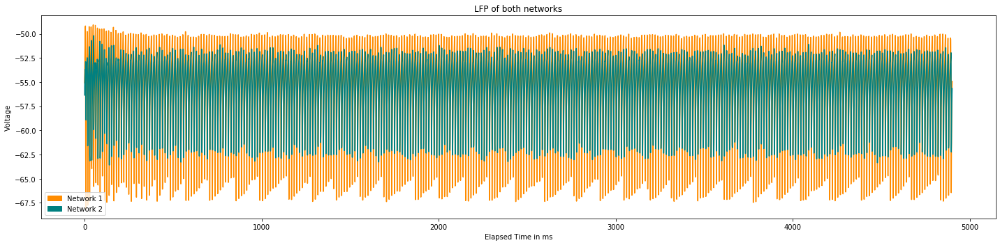

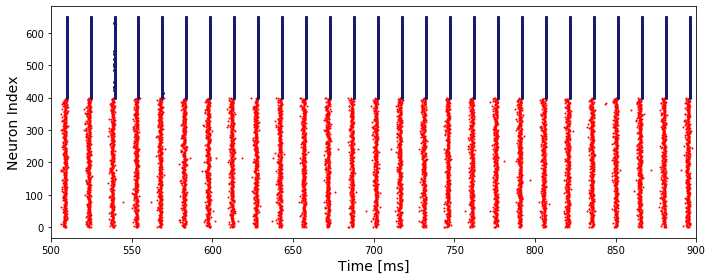

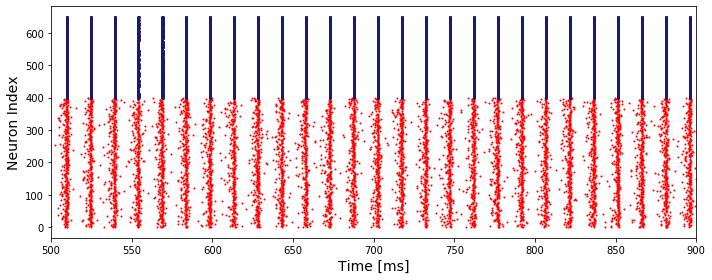

...

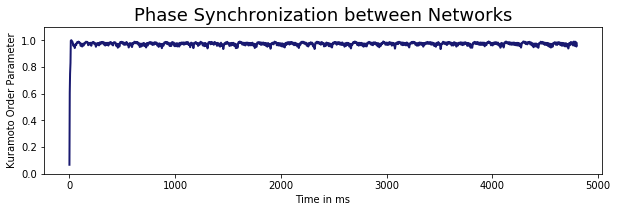

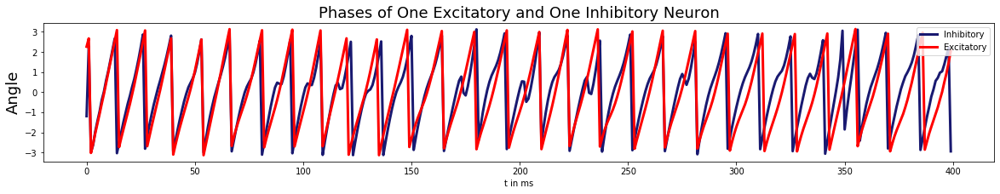

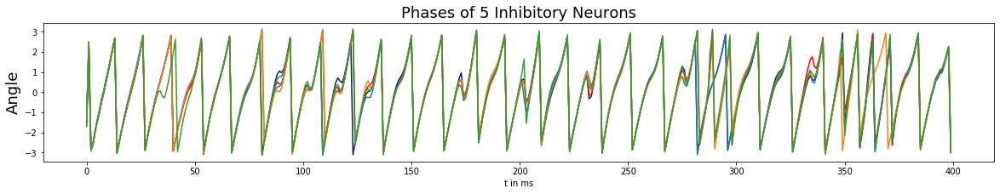

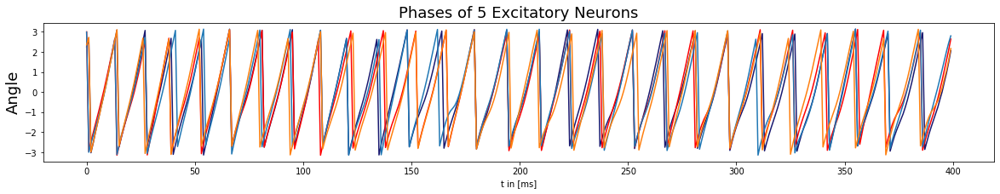

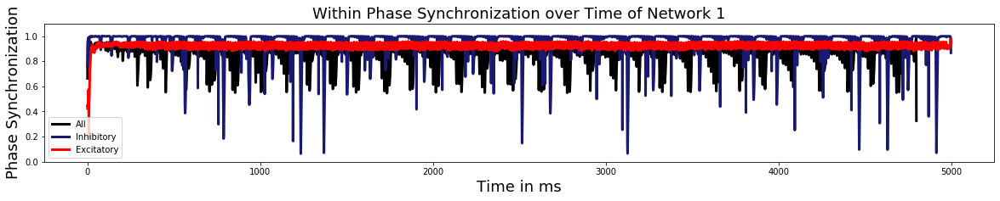

In [13]:
plots.plot_results(model, pop_rates=True, full_raster=False, x_max_psd=100, folder="PING_a2a_coupling_synch", save=True, phase_analysis=True)

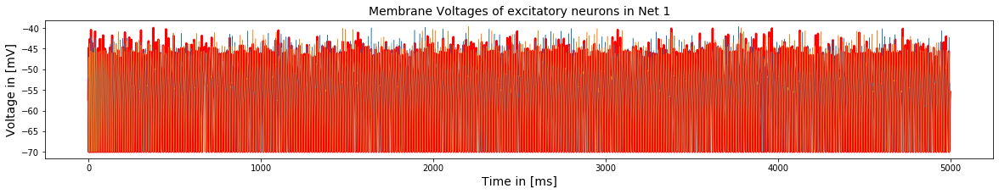

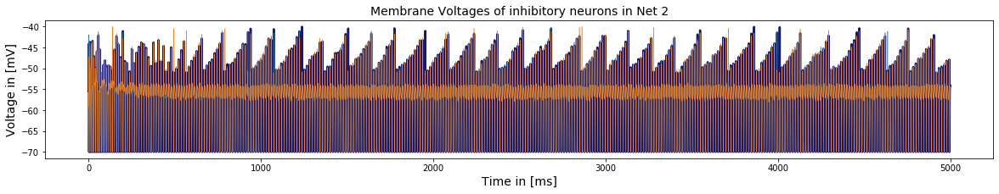

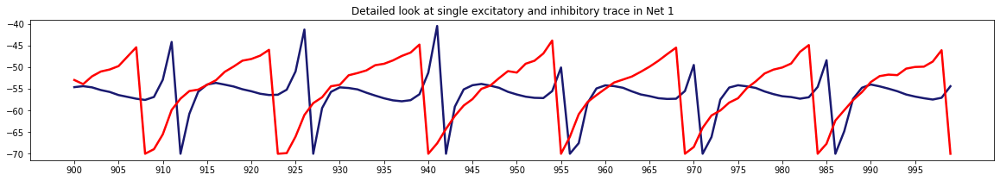

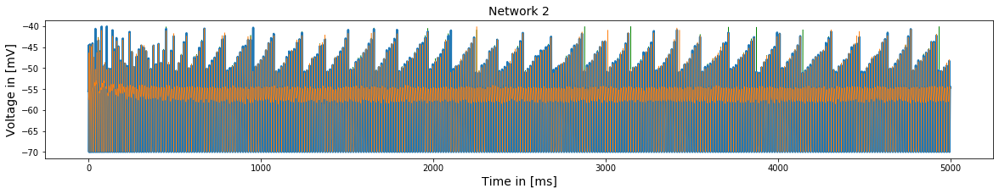

In [27]:
plots.membrane_potentials_sample(model)

0
250


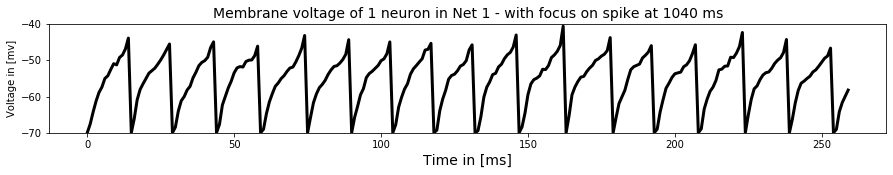

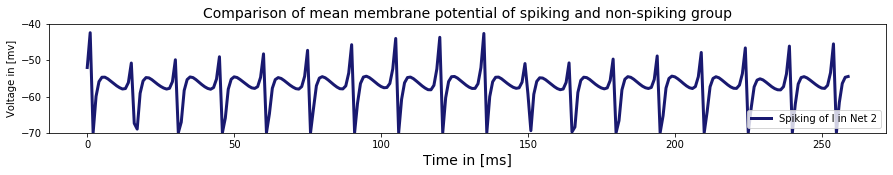

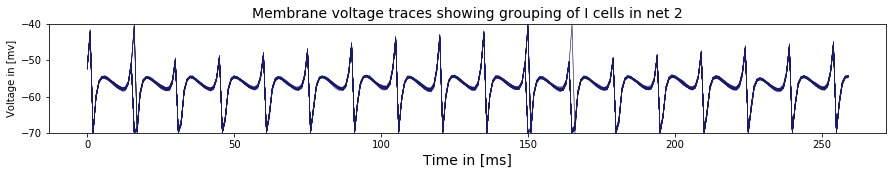

In [29]:
window=(940, 1200)

v_e = model["v_all_neurons_e"]
v2 = model["v_all_neurons_i2"]

plots.spike_variability_analysis(v_e, v2, window=window, t_s=1040, t_width=(0, 3))

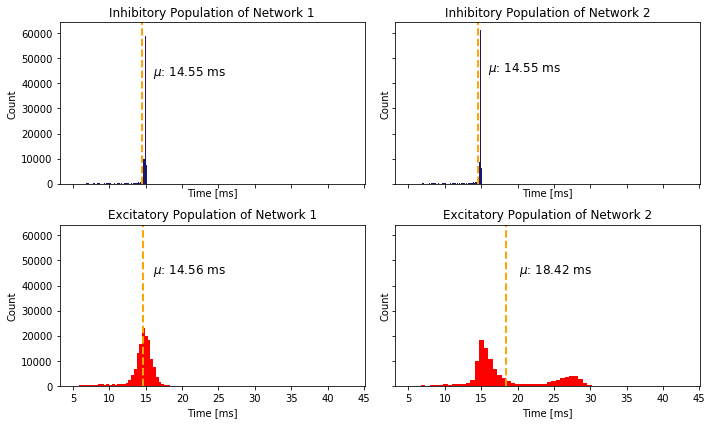

In [7]:
plots.isi_histograms(model, filter_outlier=True, folder="PING_all_to_all", key="strong_coupling")

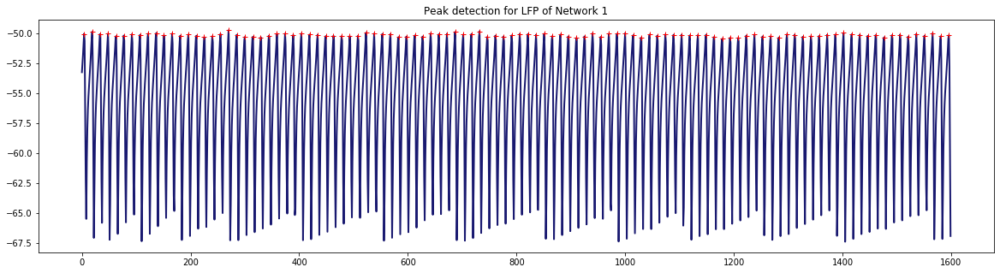

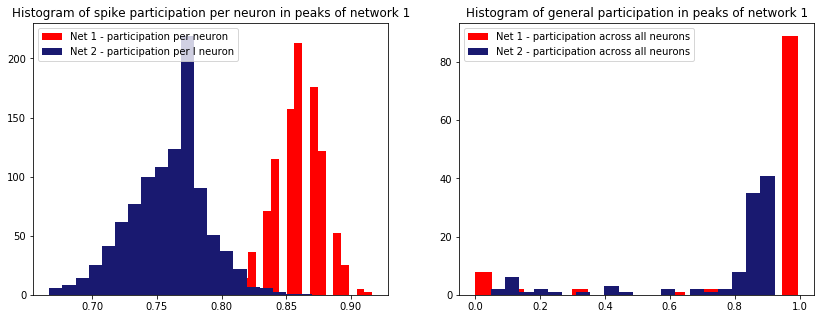

In [33]:
plots.spike_participation_histograms(model)

## **State 3** - Increase in Noise Strength leads to synchronization

Synchronized activity across and unsynchronized activity within networks

In [8]:
params_mid = dict(params)
params_mid.update({
    "poisson_variance": 8.0,
    "runtime": 5000,
})

model = runner.run(
    modified_params=params_mid,
    file_name="PING_all_to_all_synch",
    load=True
)

Global Order Parameter value of: 0.8411724257557417
Mean Phase Coherence 0.9113432872158557
Computing within synchronization for network 1 and 2
Within Synchronization of Network 1 0.41391378721423244
Within Synchronization of Network 2 0.3142986138058173


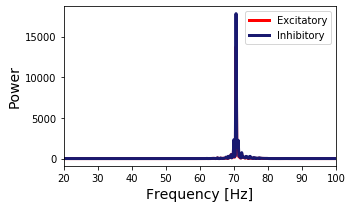

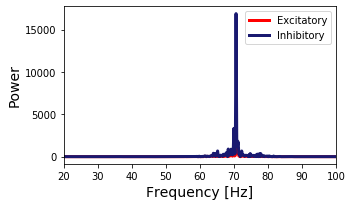

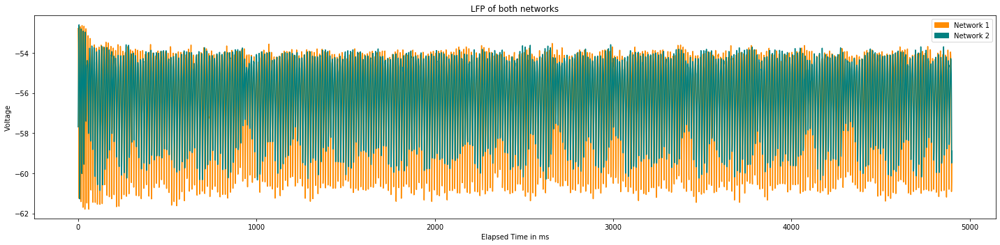

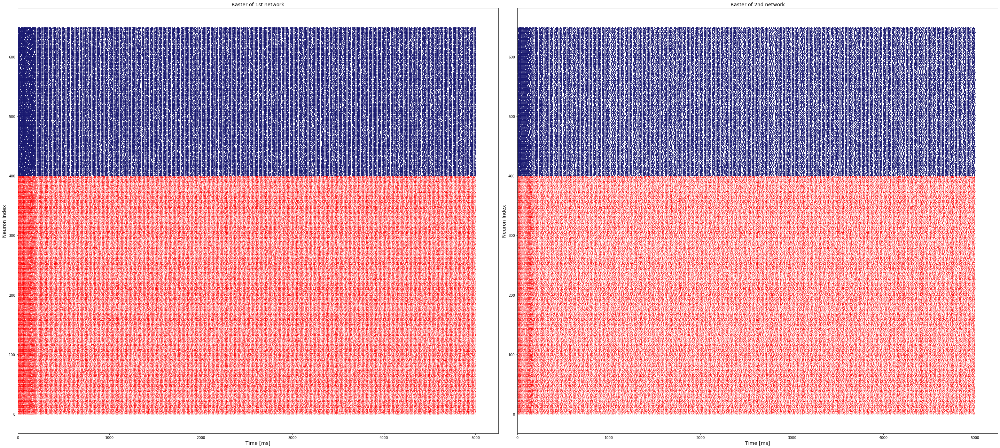

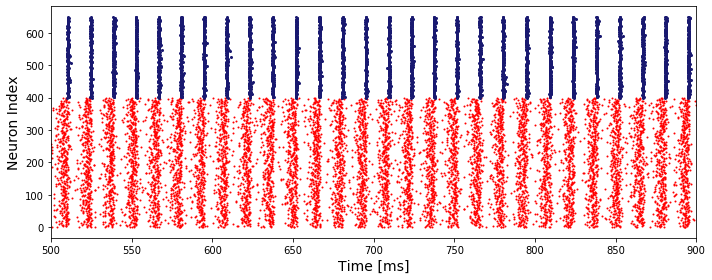

...

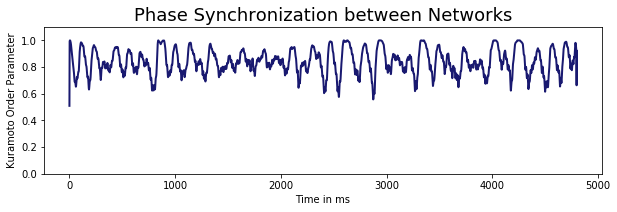

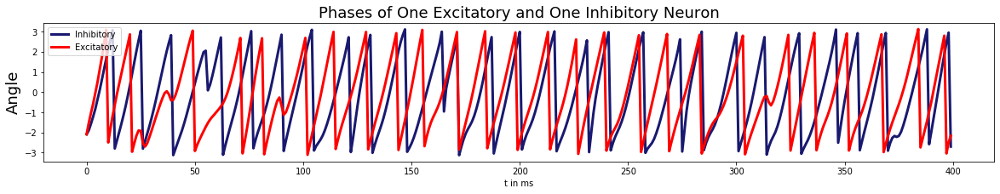

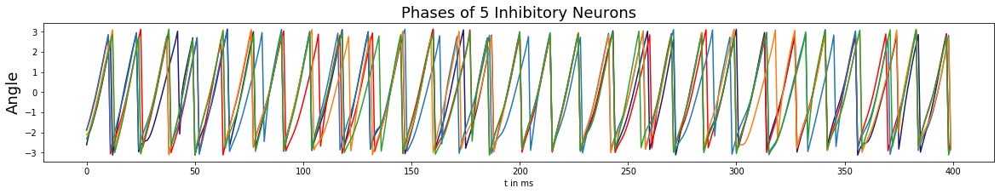

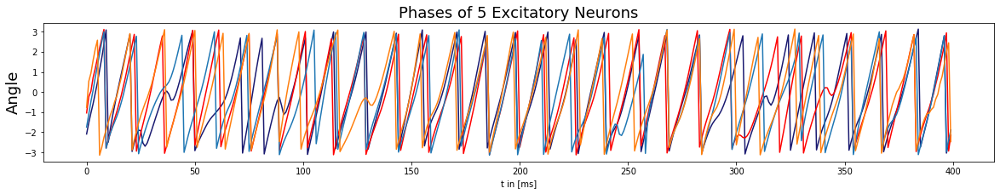

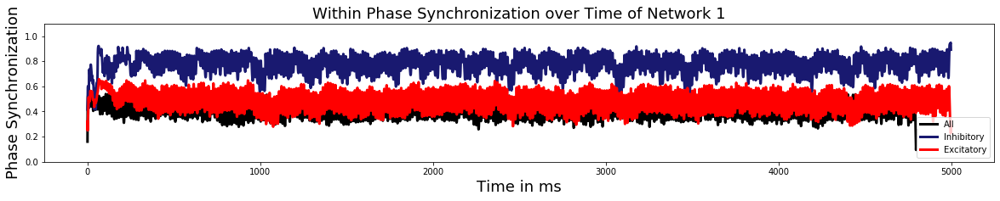

In [15]:
plots.plot_results(model, pop_rates=True, x_min_psd=20, full_raster=True, x_max_psd=100, folder="PING_a2a_noise_synch", save=True, phase_analysis=True)

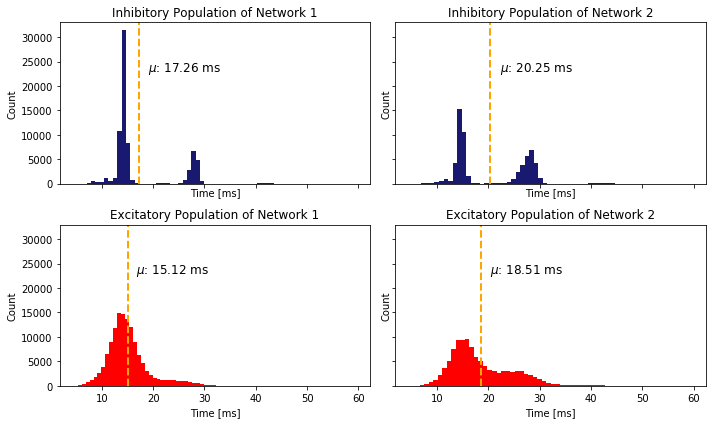

In [9]:
plots.isi_histograms(model, filter_outlier=True, folder="PING_all_to_all", key="noise_synch")

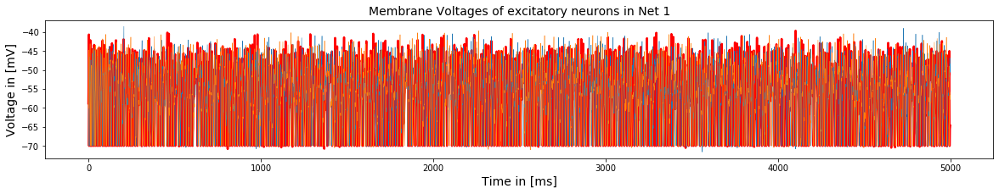

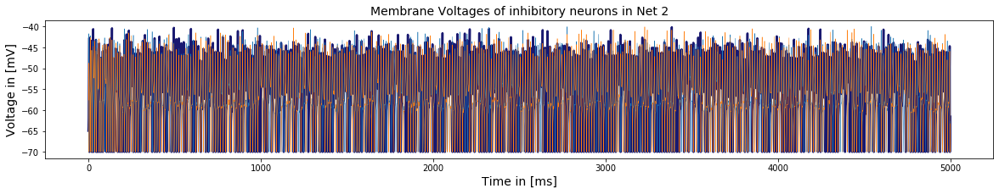

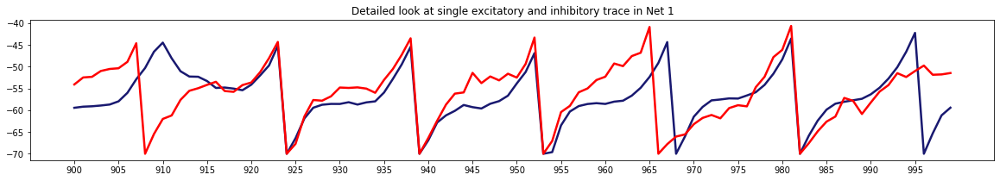

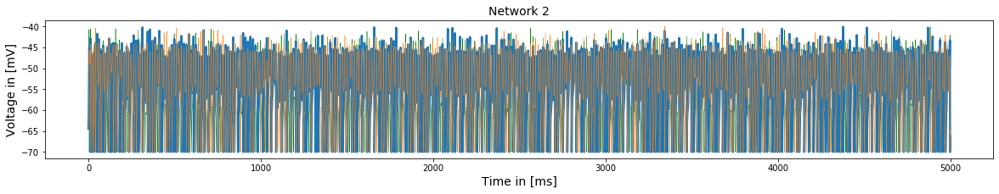

In [8]:
plots.membrane_potentials_sample(model)

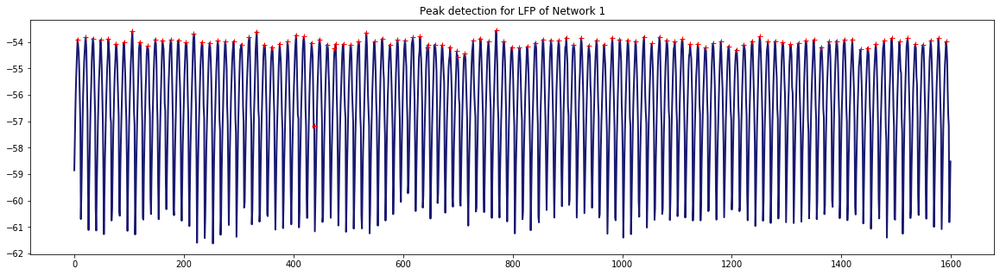

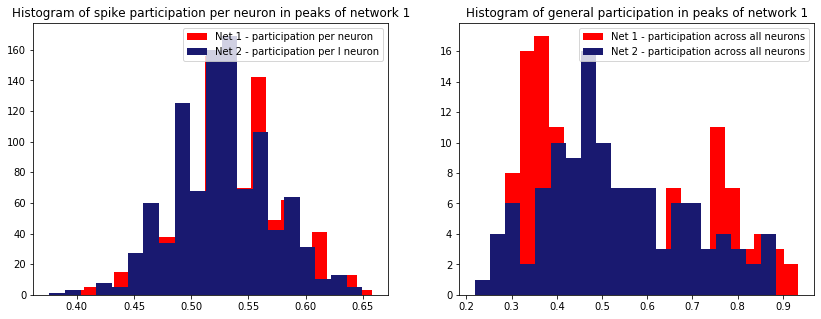

In [9]:
plots.spike_participation_histograms(model)

182
68


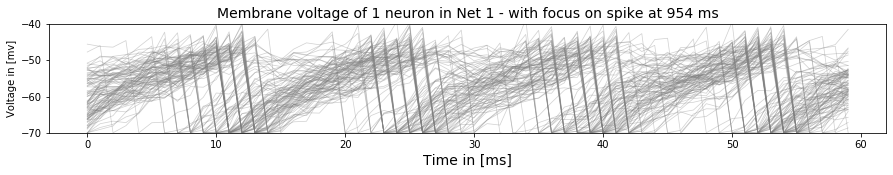

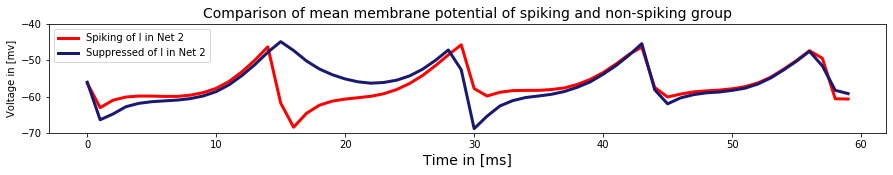

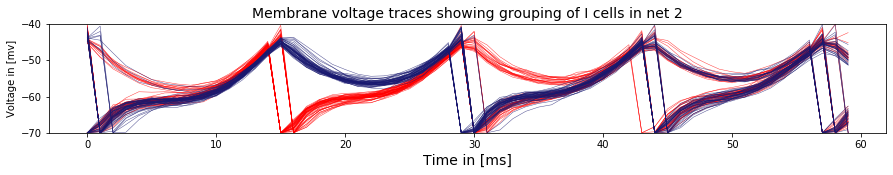

In [71]:
window=(940, 1000)

v_e = model["v_all_neurons_e"]
v2 = model["v_all_neurons_i2"]

plots.spike_variability_analysis(v_e, v2, window=window, t_s=954, t_width=(0, 5))

## **State 4** - Strong coupling and strong noise

* Shows perfect synchronization, not very noisy.
* Matches with finding in ING model

In [10]:
params_mid = dict(params)
params_mid.update({
    "poisson_variance": 4.5,
    "runtime": 5000,
    "J_ppei": 0.05,
})

model = runner.run(
    modified_params=params_mid,
    file_name="PING_all_to_all_str_noise_str_coupling",
    load=False
)

Starting simulation at t=0. s for a duration of 5. s
1.0456 s (20%) simulated in 10s, estimated 38s remaining.
2.14065 s (42%) simulated in 20s, estimated 27s remaining.
3.34525 s (66%) simulated in 30s, estimated 15s remaining.
4.48395 s (89%) simulated in 40s, estimated 5s remaining.
5. s (100%) simulated in 44s


Global Order Parameter value of: 0.9789808435152626
Mean Phase Coherence 0.9971045430341651
Computing within synchronization for network 1 and 2
Within Synchronization of Network 1 0.6194879744165847
Within Synchronization of Network 2 0.5242953355240773


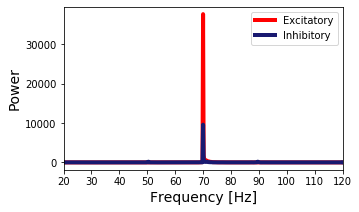

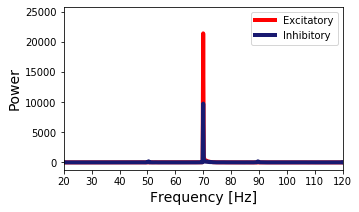

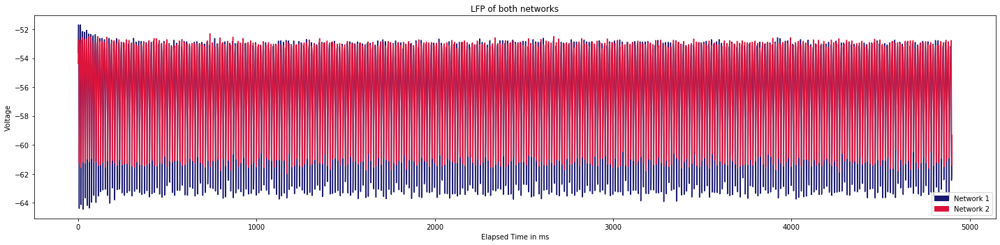

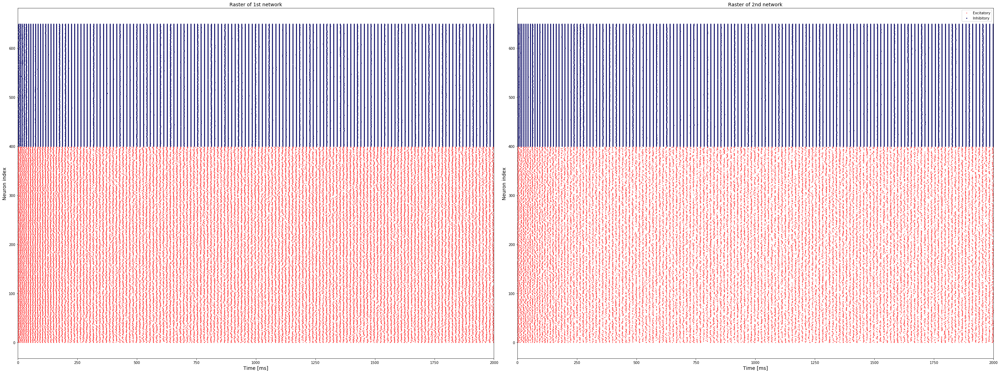

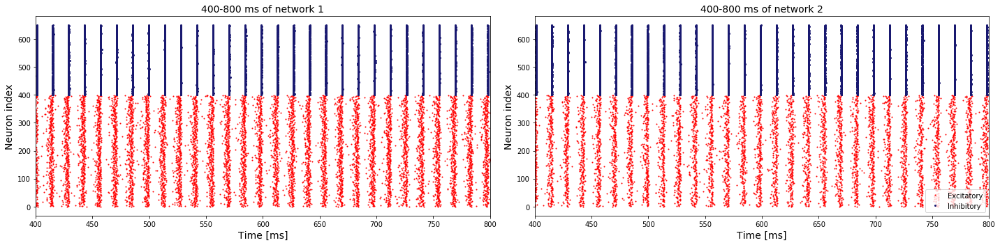

...

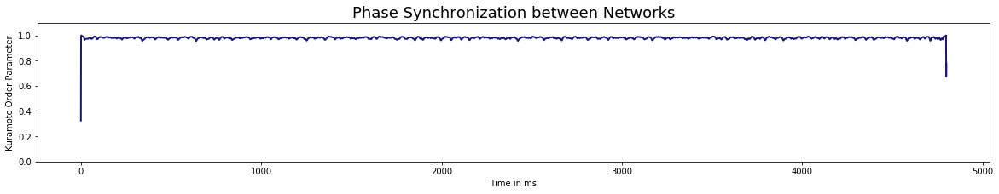

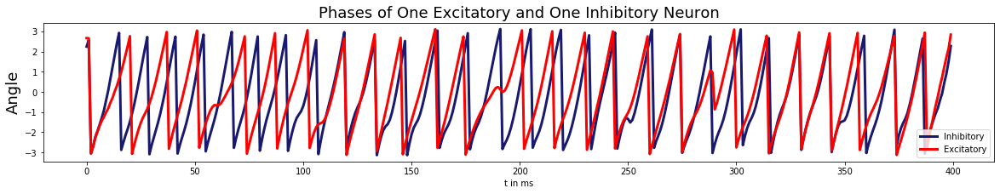

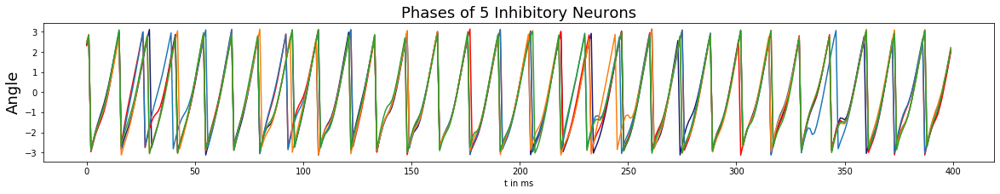

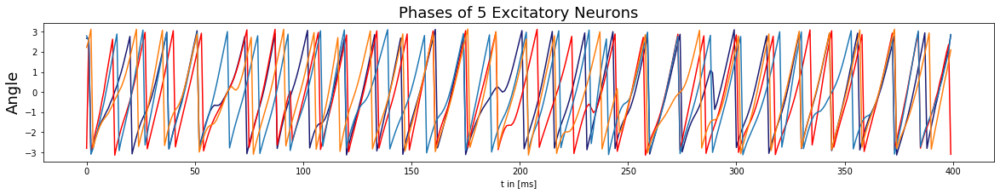

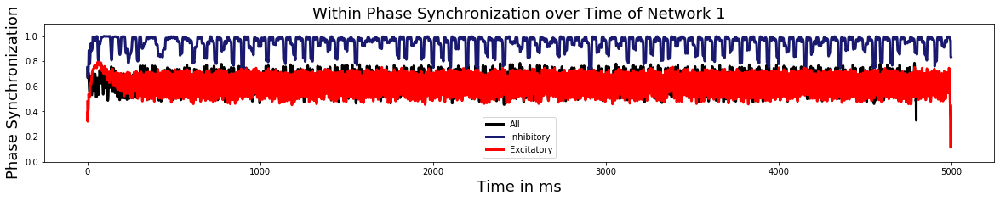

In [11]:
plots.plot_results(model, pop_rates=True, x_min_psd=20, x_max_psd=120, full_raster=True, raster_right=2000, excerpt_x_left=400, excerpt_x_right=800, phase_analysis=True)

# Exploration

## Exploration of Noise Strength - 1d

In [3]:
exp_params = {
    "poisson_variance": np.arange(0.5, 15.0, 0.1),
}

ov_params = dict(params)
ov_params.update({
    "runtime": 3000.0,
    "poisson_p": 0.85,
})

ex = mopet.Exploration(
    runner.run_in_mopet, 
    explore_params=exp_params, 
    default_params=ov_params,
    hdf_filename=constants.MODELS_PATH + "/PING_all_to_all.h5",
    exploration_name="exp_14_10"
)

In [4]:
ex.run()

2020-10-14 14:23:11,666	INFO resource_spec.py:212 -- Starting Ray with 9.38 GiB memory available for workers and up to 4.7 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-10-14 14:23:11,896	WARNING services.py:923 -- Redis failed to start, retrying now.
2020-10-14 14:23:12,174	INFO services.py:1165 -- View the Ray dashboard at localhost:8265
INFO:root:Starting 145 jobs.
100%|██████████| 145/145 [00:00<00:00, 410.34it/s]
INFO:root:Runs took 0.35611963272094727 s to submit.
  0%|          | 0/145 [00:00<?, ?it/s]

(pid=45981) Starting simulation at t=0. s for a duration of 3. s
(pid=45984) Starting simulation at t=0. s for a duration of 3. s
(pid=45985) Starting simulation at t=0. s for a duration of 3. s
(pid=45990) Starting simulation at t=0. s for a duration of 3. s
(pid=45986) Starting simulation at t=0. s for a duration of 3. s
(pid=45983) Starting simulation at t=0. s for a duration of 3. s
(pid=45991) Starting simulation at t=0. s for a duration of 3. s
(pid=45989) Starting simulation at t=0. s for a duration of 3. s
(pid=45980) Starting simulation at t=0. s for a duration of 3. s
(pid=45987) Starting simulation at t=0. s for a duration of 3. s
(pid=45982) Starting simulation at t=0. s for a duration of 3. s
(pid=45988) Starting simulation at t=0. s for a duration of 3. s
(pid=45981) 0.37655 s (12%) simulated in 10s, estimated 1m 10s remaining.
(pid=45984) 0.39765 s (13%) simulated in 10s, estimated 1m 5s remaining.
(pid=45985) 0.3892 s (12%) simulated in 10s, estimated 1m 7s remaining.
(

  7%|▋         | 10/145 [02:45<15:40,  6.96s/it]  

(pid=45984) 311.45 ms (10%) simulated in 10s, estimated 1m 26s remaining.


  8%|▊         | 12/145 [02:46<08:17,  3.74s/it]

(pid=45985) 312.85 ms (10%) simulated in 10s, estimated 1m 26s remaining.
(pid=45986) 0.31875 s (10%) simulated in 10s, estimated 1m 24s remaining.
(pid=45990) 0.31685 s (10%) simulated in 10s, estimated 1m 25s remaining.
(pid=45991) 0.3209 s (10%) simulated in 10s, estimated 1m 23s remaining.
(pid=45981) Starting simulation at t=0. s for a duration of 3. s
(pid=45987) Starting simulation at t=0. s for a duration of 3. s
(pid=45983) Starting simulation at t=0. s for a duration of 3. s
(pid=45989) Starting simulation at t=0. s for a duration of 3. s
(pid=45984) 0.66485 s (22%) simulated in 20s, estimated 1m 10s remaining.
(pid=45985) 0.6794 s (22%) simulated in 20s, estimated 1m 8s remaining.
(pid=45986) 0.6843 s (22%) simulated in 20s, estimated 1m 8s remaining.
(pid=45990) 0.6825 s (22%) simulated in 20s, estimated 1m 8s remaining.
(pid=45988) Starting simulation at t=0. s for a duration of 3. s
(pid=45991) 0.68865 s (22%) simulated in 20s, estimated 1m 7s remaining.
(pid=45980) Start

  9%|▉         | 13/145 [04:30<1:13:56, 33.61s/it]

(pid=45984) Starting simulation at t=0. s for a duration of 3. s
(pid=45990) Starting simulation at t=0. s for a duration of 3. s
(pid=45984) 315.05 ms (10%) simulated in 10s, estimated 1m 25s remaining.


 10%|█         | 15/145 [04:47<43:35, 20.12s/it]  

(pid=45990) 312.2 ms (10%) simulated in 10s, estimated 1m 26s remaining.


 14%|█▍        | 20/145 [04:52<08:29,  4.07s/it]

(pid=45987) Starting simulation at t=0. s for a duration of 3. s


 14%|█▍        | 21/145 [04:52<06:12,  3.01s/it]

(pid=45984) 0.61415 s (20%) simulated in 20s, estimated 1m 18s remaining.


 15%|█▌        | 22/145 [04:54<05:36,  2.73s/it]

(pid=45986) Starting simulation at t=0. s for a duration of 3. s
(pid=45985) Starting simulation at t=0. s for a duration of 3. s
(pid=45991) Starting simulation at t=0. s for a duration of 3. s


 17%|█▋        | 24/145 [04:56<03:33,  1.77s/it]

(pid=45990) 0.6285 s (20%) simulated in 20s, estimated 1m 15s remaining.
(pid=45987) 0.3544 s (11%) simulated in 10s, estimated 1m 15s remaining.
(pid=45984) 0.98275 s (32%) simulated in 30s, estimated 1m 2s remaining.
(pid=45986) 0.3683 s (12%) simulated in 10s, estimated 1m 11s remaining.
(pid=45985) 0.3644 s (12%) simulated in 10s, estimated 1m 12s remaining.
(pid=45991) 0.36965 s (12%) simulated in 10s, estimated 1m 11s remaining.
(pid=45981) Starting simulation at t=0. s for a duration of 3. s
(pid=45990) 1.01205 s (33%) simulated in 30s, estimated 59s remaining.
(pid=45983) Starting simulation at t=0. s for a duration of 3. s
(pid=45989) Starting simulation at t=0. s for a duration of 3. s
(pid=45987) 0.7272 s (24%) simulated in 20s, estimated 1m 3s remaining.
(pid=45988) Starting simulation at t=0. s for a duration of 3. s
(pid=45980) Starting simulation at t=0. s for a duration of 3. s
(pid=45982) Starting simulation at t=0. s for a duration of 3. s
(pid=45984) 1.35045 s (45%) 

 17%|█▋        | 25/145 [06:25<55:45, 27.88s/it]

(pid=45981) 2.8933 s (96%) simulated in 1m 20s, estimated 3s remaining.
(pid=45983) 2.91005 s (97%) simulated in 1m 20s, estimated 2s remaining.
(pid=45989) 2.85705 s (95%) simulated in 1m 20s, estimated 4s remaining.
(pid=45984) Starting simulation at t=0. s for a duration of 3. s
(pid=45981) 3. s (100%) simulated in 1m 23s
(pid=45983) 3. s (100%) simulated in 1m 22s
(pid=45990) Starting simulation at t=0. s for a duration of 3. s
(pid=45988) 2.87805 s (95%) simulated in 1m 20s, estimated 3s remaining.
(pid=45980) 2.88615 s (96%) simulated in 1m 20s, estimated 3s remaining.
(pid=45989) 3. s (100%) simulated in 1m 24s
(pid=45982) 2.8833 s (96%) simulated in 1m 20s, estimated 3s remaining.
(pid=45988) 3. s (100%) simulated in 1m 23s
(pid=45980) 3. s (100%) simulated in 1m 23s
(pid=45982) 3. s (100%) simulated in 1m 23s
(pid=45984) 0.32115 s (10%) simulated in 10s, estimated 1m 23s remaining.
(pid=45990) 0.3296 s (10%) simulated in 10s, estimated 1m 21s remaining.


 19%|█▉        | 28/145 [06:47<25:10, 12.91s/it]

(pid=45987) Starting simulation at t=0. s for a duration of 3. s


 20%|██        | 29/145 [06:47<17:43,  9.17s/it]

(pid=45984) 0.6618 s (22%) simulated in 20s, estimated 1m 11s remaining.
(pid=45986) Starting simulation at t=0. s for a duration of 3. s
(pid=45985) Starting simulation at t=0. s for a duration of 3. s
(pid=45990) 0.67745 s (22%) simulated in 20s, estimated 1m 9s remaining.
(pid=45987) 0.3476 s (11%) simulated in 10s, estimated 1m 16s remaining.


 21%|██        | 30/145 [06:59<18:41,  9.75s/it]

(pid=45984) 1.01935 s (33%) simulated in 30s, estimated 58s remaining.


 22%|██▏       | 32/145 [07:00<09:51,  5.24s/it]

(pid=45986) 0.35195 s (11%) simulated in 10s, estimated 1m 15s remaining.
(pid=45985) 0.3493 s (11%) simulated in 10s, estimated 1m 16s remaining.
(pid=45990) 1.03345 s (34%) simulated in 30s, estimated 57s remaining.


 23%|██▎       | 33/145 [07:02<07:51,  4.21s/it]

(pid=45983) Starting simulation at t=0. s for a duration of 3. s


 23%|██▎       | 34/145 [07:04<06:42,  3.63s/it]

(pid=45989) Starting simulation at t=0. s for a duration of 3. s


 25%|██▍       | 36/145 [07:06<04:04,  2.24s/it]

(pid=45991) Starting simulation at t=0. s for a duration of 3. s
(pid=45987) 0.68365 s (22%) simulated in 20s, estimated 1m 8s remaining.
(pid=45984) 1.3652 s (45%) simulated in 40s, estimated 48s remaining.
(pid=45986) 0.7106 s (23%) simulated in 20s, estimated 1m 4s remaining.
(pid=45985) 0.70765 s (23%) simulated in 20s, estimated 1m 5s remaining.
(pid=45990) 1.3935 s (46%) simulated in 40s, estimated 46s remaining.
(pid=45983) 0.37085 s (12%) simulated in 10s, estimated 1m 11s remaining.
(pid=45989) 0.3722 s (12%) simulated in 10s, estimated 1m 11s remaining.
(pid=45991) 0.3822 s (12%) simulated in 10s, estimated 1m 8s remaining.
(pid=45981) Starting simulation at t=0. s for a duration of 3. s
(pid=45987) 1.06205 s (35%) simulated in 30s, estimated 55s remaining.
(pid=45984) 1.7492 s (58%) simulated in 50s, estimated 36s remaining.
(pid=45986) 1.0908 s (36%) simulated in 30s, estimated 53s remaining.
(pid=45985) 1.0897 s (36%) simulated in 30s, estimated 53s remaining.
(pid=45990) 

 26%|██▌       | 38/145 [08:21<30:11, 16.93s/it]

(pid=45988) 2.1331 s (71%) simulated in 1m 0s, estimated 24s remaining.
(pid=45982) 2.12695 s (70%) simulated in 1m 0s, estimated 25s remaining.
(pid=45980) 2.13545 s (71%) simulated in 1m 0s, estimated 24s remaining.
(pid=45983) 2.92145 s (97%) simulated in 1m 20s, estimated 2s remaining.
(pid=45989) 2.8799 s (95%) simulated in 1m 20s, estimated 3s remaining.
(pid=45983) 3. s (100%) simulated in 1m 22s
(pid=45991) 2.90365 s (96%) simulated in 1m 20s, estimated 3s remaining.
(pid=45981) 2.48535 s (82%) simulated in 1m 10s, estimated 14s remaining.
(pid=45989) 3. s (100%) simulated in 1m 23s
(pid=45991) 3. s (100%) simulated in 1m 22s
(pid=45988) 2.484 s (82%) simulated in 1m 10s, estimated 15s remaining.
(pid=45982) 2.4772 s (82%) simulated in 1m 10s, estimated 15s remaining.
(pid=45980) 2.4822 s (82%) simulated in 1m 10s, estimated 15s remaining.
(pid=45981) 2.83295 s (94%) simulated in 1m 20s, estimated 5s remaining.


 27%|██▋       | 39/145 [08:39<30:30, 17.27s/it]

(pid=45984) Starting simulation at t=0. s for a duration of 3. s
(pid=45990) Starting simulation at t=0. s for a duration of 3. s


 28%|██▊       | 41/145 [08:42<15:36,  9.00s/it]

(pid=45981) 3. s (100%) simulated in 1m 24s
(pid=45988) 2.8216 s (94%) simulated in 1m 20s, estimated 5s remaining.
(pid=45982) 2.82205 s (94%) simulated in 1m 20s, estimated 5s remaining.
(pid=45980) 2.8317 s (94%) simulated in 1m 20s, estimated 5s remaining.
(pid=45986) Starting simulation at t=0. s for a duration of 3. s
(pid=45988) 3. s (100%) simulated in 1m 24s
(pid=45982) 3. s (100%) simulated in 1m 24s
(pid=45980) 3. s (100%) simulated in 1m 24s
(pid=45984) 0.3566 s (11%) simulated in 10s, estimated 1m 14s remaining.
(pid=45987) Starting simulation at t=0. s for a duration of 3. s
(pid=45990) 0.3541 s (11%) simulated in 10s, estimated 1m 15s remaining.
(pid=45986) 0.37135 s (12%) simulated in 10s, estimated 1m 11s remaining.


 29%|██▉       | 42/145 [08:56<18:25, 10.73s/it]

(pid=45989) Starting simulation at t=0. s for a duration of 3. s
(pid=45985) Starting simulation at t=0. s for a duration of 3. s
(pid=45991) Starting simulation at t=0. s for a duration of 3. s
(pid=45984) 0.73775 s (24%) simulated in 20s, estimated 1m 1s remaining.
(pid=45987) 0.3721 s (12%) simulated in 10s, estimated 1m 11s remaining.
(pid=45990) 0.7348 s (24%) simulated in 20s, estimated 1m 2s remaining.
(pid=45986) 0.755 s (25%) simulated in 20s, estimated 59s remaining.


 31%|███       | 45/145 [09:08<09:11,  5.52s/it]

(pid=45989) 0.3628 s (12%) simulated in 10s, estimated 1m 13s remaining.
(pid=45985) 0.3608 s (12%) simulated in 10s, estimated 1m 13s remaining.
(pid=45991) 0.365 s (12%) simulated in 10s, estimated 1m 12s remaining.
(pid=45984) 1.10345 s (36%) simulated in 30s, estimated 52s remaining.
(pid=45987) 0.7322 s (24%) simulated in 20s, estimated 1m 2s remaining.
(pid=45990) 1.09835 s (36%) simulated in 30s, estimated 52s remaining.
(pid=45983) Starting simulation at t=0. s for a duration of 3. s


 33%|███▎      | 48/145 [09:15<04:54,  3.04s/it]

(pid=45986) 1.12435 s (37%) simulated in 30s, estimated 50s remaining.
(pid=45989) 0.7433 s (24%) simulated in 20s, estimated 1m 1s remaining.
(pid=45985) 0.7374 s (24%) simulated in 20s, estimated 1m 1s remaining.
(pid=45991) 0.7486 s (24%) simulated in 20s, estimated 1m 0s remaining.
(pid=45984) 1.4846 s (49%) simulated in 40s, estimated 41s remaining.
(pid=45987) 1.1072 s (36%) simulated in 30s, estimated 51s remaining.
(pid=45990) 1.47975 s (49%) simulated in 40s, estimated 41s remaining.
(pid=45983) 0.3775 s (12%) simulated in 10s, estimated 1m 9s remaining.
(pid=45986) 1.51645 s (50%) simulated in 40s, estimated 39s remaining.
(pid=45981) Starting simulation at t=0. s for a duration of 3. s
(pid=45989) 1.13295 s (37%) simulated in 30s, estimated 49s remaining.
(pid=45988) Starting simulation at t=0. s for a duration of 3. s
(pid=45985) 1.1264 s (37%) simulated in 30s, estimated 50s remaining.
(pid=45991) 1.14115 s (38%) simulated in 30s, estimated 49s remaining.
(pid=45984) 1.870

 34%|███▍      | 50/145 [10:28<26:57, 17.03s/it]

(pid=45988) 2.2025 s (73%) simulated in 1m 0s, estimated 22s remaining.
(pid=45982) 2.20065 s (73%) simulated in 1m 0s, estimated 22s remaining.
(pid=45980) 2.21825 s (73%) simulated in 1m 0s, estimated 21s remaining.
(pid=45983) 2.989 s (99%) simulated in 1m 20s, estimated < 1s remaining.
(pid=45990) Starting simulation at t=0. s for a duration of 3. s
(pid=45983) 3. s (100%) simulated in 1m 20s
(pid=45986) Starting simulation at t=0. s for a duration of 3. s
(pid=45981) 2.5546 s (85%) simulated in 1m 10s, estimated 12s remaining.


 36%|███▌      | 52/145 [10:39<16:44, 10.80s/it]

(pid=45988) 2.5643 s (85%) simulated in 1m 10s, estimated 12s remaining.
(pid=45982) 2.55815 s (85%) simulated in 1m 10s, estimated 12s remaining.
(pid=45980) 2.57505 s (85%) simulated in 1m 10s, estimated 12s remaining.
(pid=45990) 0.34405 s (11%) simulated in 10s, estimated 1m 17s remaining.
(pid=45987) Starting simulation at t=0. s for a duration of 3. s
(pid=45986) 0.3502 s (11%) simulated in 10s, estimated 1m 16s remaining.
(pid=45981) 2.8995 s (96%) simulated in 1m 20s, estimated 3s remaining.
(pid=45984) Starting simulation at t=0. s for a duration of 3. s


 37%|███▋      | 53/145 [10:47<15:14,  9.94s/it]

(pid=45981) 3. s (100%) simulated in 1m 22s
(pid=45988) 2.91705 s (97%) simulated in 1m 20s, estimated 2s remaining.
(pid=45985) Starting simulation at t=0. s for a duration of 3. s
(pid=45982) 2.9133 s (97%) simulated in 1m 20s, estimated 2s remaining.
(pid=45980) 2.9307 s (97%) simulated in 1m 20s, estimated 2s remaining.
(pid=45990) 0.6986 s (23%) simulated in 20s, estimated 1m 6s remaining.
(pid=45988) 3. s (100%) simulated in 1m 22s
(pid=45987) 0.34105 s (11%) simulated in 10s, estimated 1m 18s remaining.
(pid=45980) 3. s (100%) simulated in 1m 21s
(pid=45982) 3. s (100%) simulated in 1m 22s
(pid=45986) 0.71585 s (23%) simulated in 20s, estimated 1m 4s remaining.
(pid=45984) 0.3544 s (11%) simulated in 10s, estimated 1m 15s remaining.


 39%|███▊      | 56/145 [10:59<07:47,  5.26s/it]

(pid=45985) 0.37265 s (12%) simulated in 10s, estimated 1m 11s remaining.
(pid=45990) 1.0858 s (36%) simulated in 30s, estimated 53s remaining.
(pid=45983) Starting simulation at t=0. s for a duration of 3. s
(pid=45987) 0.7236 s (24%) simulated in 20s, estimated 1m 3s remaining.
(pid=45986) 1.107 s (36%) simulated in 30s, estimated 51s remaining.
(pid=45989) Starting simulation at t=0. s for a duration of 3. s
(pid=45991) Starting simulation at t=0. s for a duration of 3. s
(pid=45984) 0.74225 s (24%) simulated in 20s, estimated 1m 1s remaining.
(pid=45985) 0.7687 s (25%) simulated in 20s, estimated 58s remaining.
(pid=45990) 1.4812 s (49%) simulated in 40s, estimated 41s remaining.
(pid=45983) 0.38885 s (12%) simulated in 10s, estimated 1m 7s remaining.


 39%|███▉      | 57/145 [11:13<11:17,  7.70s/it]

(pid=45987) 1.11235 s (37%) simulated in 30s, estimated 51s remaining.
(pid=45986) 1.49895 s (49%) simulated in 40s, estimated 40s remaining.
(pid=45989) 0.37255 s (12%) simulated in 10s, estimated 1m 11s remaining.
(pid=45991) 0.3774 s (12%) simulated in 10s, estimated 1m 9s remaining.
(pid=45981) Starting simulation at t=0. s for a duration of 3. s
(pid=45984) 1.1245 s (37%) simulated in 30s, estimated 50s remaining.


 41%|████▏     | 60/145 [11:19<05:26,  3.84s/it]

(pid=45985) 1.14825 s (38%) simulated in 30s, estimated 48s remaining.
(pid=45990) 1.85845 s (61%) simulated in 50s, estimated 31s remaining.
(pid=45980) Starting simulation at t=0. s for a duration of 3. s
(pid=45983) 0.76305 s (25%) simulated in 20s, estimated 59s remaining.
(pid=45987) 1.483 s (49%) simulated in 40s, estimated 41s remaining.
(pid=45986) 1.87425 s (62%) simulated in 50s, estimated 30s remaining.
(pid=45989) 0.74145 s (24%) simulated in 20s, estimated 1m 1s remaining.
(pid=45991) 0.7529 s (25%) simulated in 20s, estimated 1m 0s remaining.
(pid=45981) 0.3665 s (12%) simulated in 10s, estimated 1m 12s remaining.
(pid=45984) 1.4952 s (49%) simulated in 40s, estimated 40s remaining.
(pid=45985) 1.53015 s (51%) simulated in 40s, estimated 38s remaining.
(pid=45990) 2.23355 s (74%) simulated in 1m 0s, estimated 21s remaining.
(pid=45980) 0.3721 s (12%) simulated in 10s, estimated 1m 11s remaining.
(pid=45983) 1.1422 s (38%) simulated in 30s, estimated 49s remaining.
(pid=45

 43%|████▎     | 62/145 [12:31<23:35, 17.06s/it]

(pid=45987) Starting simulation at t=0. s for a duration of 3. s


 43%|████▎     | 63/145 [12:32<16:29, 12.07s/it]

(pid=45980) 2.66545 s (88%) simulated in 1m 10s, estimated 9s remaining.


 44%|████▍     | 64/145 [12:32<11:37,  8.61s/it]

(pid=45988) 2.25315 s (75%) simulated in 1m 0s, estimated 20s remaining.
(pid=45984) Starting simulation at t=0. s for a duration of 3. s
(pid=45981) 2.99845 s (99%) simulated in 1m 20s, estimated < 1s remaining.
(pid=45981) 3. s (100%) simulated in 1m 20s
(pid=45982) 2.26195 s (75%) simulated in 1m 0s, estimated 20s remaining.
(pid=45986) Starting simulation at t=0. s for a duration of 3. s
(pid=45990) 0.7347 s (24%) simulated in 20s, estimated 1m 2s remaining.
(pid=45980) 3. s (100%) simulated in 1m 18s
(pid=45987) 0.36075 s (12%) simulated in 10s, estimated 1m 13s remaining.
(pid=45988) 2.61995 s (87%) simulated in 1m 10s, estimated 10s remaining.
(pid=45984) 0.36005 s (12%) simulated in 10s, estimated 1m 13s remaining.
(pid=45982) 2.63185 s (87%) simulated in 1m 10s, estimated 10s remaining.
(pid=45986) 0.35705 s (11%) simulated in 10s, estimated 1m 14s remaining.
(pid=45990) 1.1016 s (36%) simulated in 30s, estimated 52s remaining.


 46%|████▌     | 66/145 [12:51<10:46,  8.19s/it]

(pid=45987) 0.71365 s (23%) simulated in 20s, estimated 1m 4s remaining.


 47%|████▋     | 68/145 [12:52<05:25,  4.23s/it]

(pid=45991) Starting simulation at t=0. s for a duration of 3. s
(pid=45985) Starting simulation at t=0. s for a duration of 3. s
(pid=45989) Starting simulation at t=0. s for a duration of 3. s
(pid=45984) 0.7098 s (23%) simulated in 20s, estimated 1m 5s remaining.
(pid=45988) 2.97035 s (99%) simulated in 1m 20s, estimated 1s remaining.
(pid=45988) 3. s (100%) simulated in 1m 20s
(pid=45982) 2.98515 s (99%) simulated in 1m 20s, estimated < 1s remaining.
(pid=45982) 3. s (100%) simulated in 1m 20s
(pid=45986) 0.7103 s (23%) simulated in 20s, estimated 1m 4s remaining.
(pid=45990) 1.46505 s (48%) simulated in 40s, estimated 42s remaining.
(pid=45987) 1.08135 s (36%) simulated in 30s, estimated 53s remaining.


 48%|████▊     | 69/145 [13:02<07:35,  5.99s/it]

(pid=45991) 0.3691 s (12%) simulated in 10s, estimated 1m 11s remaining.
(pid=45985) 0.3661 s (12%) simulated in 10s, estimated 1m 12s remaining.
(pid=45989) 0.369 s (12%) simulated in 10s, estimated 1m 11s remaining.
(pid=45983) Starting simulation at t=0. s for a duration of 3. s
(pid=45984) 1.0828 s (36%) simulated in 30s, estimated 53s remaining.
(pid=45981) Starting simulation at t=0. s for a duration of 3. s
(pid=45986) 1.0905 s (36%) simulated in 30s, estimated 53s remaining.
(pid=45990) 1.8545 s (61%) simulated in 50s, estimated 31s remaining.
(pid=45987) 1.46645 s (48%) simulated in 40s, estimated 42s remaining.
(pid=45991) 0.76685 s (25%) simulated in 20s, estimated 58s remaining.
(pid=45985) 0.76075 s (25%) simulated in 20s, estimated 59s remaining.
(pid=45989) 0.7618 s (25%) simulated in 20s, estimated 59s remaining.
(pid=45983) 0.3898 s (12%) simulated in 10s, estimated 1m 7s remaining.
(pid=45984) 1.47555 s (49%) simulated in 40s, estimated 41s remaining.
(pid=45981) 0.38

 48%|████▊     | 70/145 [13:19<11:44,  9.39s/it]

(pid=45990) 2.2526 s (75%) simulated in 1m 0s, estimated 20s remaining.


 50%|████▉     | 72/145 [13:21<06:10,  5.08s/it]

(pid=45987) 1.85595 s (61%) simulated in 50s, estimated 31s remaining.
(pid=45988) Starting simulation at t=0. s for a duration of 3. s
(pid=45991) 1.1514 s (38%) simulated in 30s, estimated 48s remaining.
(pid=45985) 1.14735 s (38%) simulated in 30s, estimated 48s remaining.
(pid=45980) Starting simulation at t=0. s for a duration of 3. s
(pid=45989) 1.14635 s (38%) simulated in 30s, estimated 49s remaining.
(pid=45983) 0.77695 s (25%) simulated in 20s, estimated 57s remaining.
(pid=45984) 1.86125 s (62%) simulated in 50s, estimated 31s remaining.
(pid=45981) 0.7783 s (25%) simulated in 20s, estimated 57s remaining.
(pid=45986) 1.87045 s (62%) simulated in 50s, estimated 30s remaining.
(pid=45990) 2.6507 s (88%) simulated in 1m 10s, estimated 9s remaining.
(pid=45987) 2.2533 s (75%) simulated in 1m 0s, estimated 20s remaining.
(pid=45988) 0.3804 s (12%) simulated in 10s, estimated 1m 9s remaining.
(pid=45991) 1.5464 s (51%) simulated in 40s, estimated 38s remaining.
(pid=45985) 1.5389

 50%|█████     | 73/145 [14:03<19:10, 15.98s/it]

(pid=45988) 1.5039 s (50%) simulated in 40s, estimated 40s remaining.
(pid=45991) 2.6808 s (89%) simulated in 1m 10s, estimated 8s remaining.
(pid=45985) 2.67745 s (89%) simulated in 1m 10s, estimated 8s remaining.
(pid=45980) 1.53035 s (51%) simulated in 40s, estimated 38s remaining.
(pid=45989) 2.6672 s (88%) simulated in 1m 10s, estimated 9s remaining.
(pid=45983) 2.3091 s (76%) simulated in 1m 0s, estimated 18s remaining.
(pid=45981) 2.2956 s (76%) simulated in 1m 0s, estimated 18s remaining.
(pid=45990) Starting simulation at t=0. s for a duration of 3. s
(pid=45982) 1.1332 s (37%) simulated in 30s, estimated 49s remaining.
(pid=45991) 3. s (100%) simulated in 1m 18s
(pid=45985) 3. s (100%) simulated in 1m 18s
(pid=45988) 1.869 s (62%) simulated in 50s, estimated 30s remaining.
(pid=45989) 3. s (100%) simulated in 1m 19s
(pid=45980) 1.89555 s (63%) simulated in 50s, estimated 29s remaining.
(pid=45983) 2.6788 s (89%) simulated in 1m 10s, estimated 8s remaining.
(pid=45981) 2.6571 

 51%|█████     | 74/145 [14:23<20:30, 17.32s/it]

(pid=45983) 3. s (100%) simulated in 1m 18s


 52%|█████▏    | 76/145 [14:24<10:00,  8.70s/it]

(pid=45980) 2.25585 s (75%) simulated in 1m 0s, estimated 20s remaining.
(pid=45981) 3. s (100%) simulated in 1m 19s
(pid=45990) 0.7404 s (24%) simulated in 20s, estimated 1m 1s remaining.
(pid=45986) Starting simulation at t=0. s for a duration of 3. s
(pid=45982) 1.87235 s (62%) simulated in 50s, estimated 30s remaining.
(pid=45987) 0.37575 s (12%) simulated in 10s, estimated 1m 10s remaining.
(pid=45988) 2.6137 s (87%) simulated in 1m 10s, estimated 10s remaining.
(pid=45980) 2.6418 s (88%) simulated in 1m 10s, estimated 9s remaining.
(pid=45990) 1.1325 s (37%) simulated in 30s, estimated 49s remaining.
(pid=45986) 0.3826 s (12%) simulated in 10s, estimated 1m 8s remaining.


 53%|█████▎    | 77/145 [14:38<11:40, 10.31s/it]

(pid=45984) Starting simulation at t=0. s for a duration of 3. s
(pid=45982) 2.24495 s (74%) simulated in 1m 0s, estimated 20s remaining.
(pid=45987) 0.74525 s (24%) simulated in 20s, estimated 1m 1s remaining.
(pid=45991) Starting simulation at t=0. s for a duration of 3. s
(pid=45985) Starting simulation at t=0. s for a duration of 3. s
(pid=45988) 2.9671 s (98%) simulated in 1m 20s, estimated 1s remaining.
(pid=45988) 3. s (100%) simulated in 1m 21s
(pid=45980) 2.98955 s (99%) simulated in 1m 20s, estimated < 1s remaining.
(pid=45980) 3. s (100%) simulated in 1m 20s
(pid=45990) 1.48395 s (49%) simulated in 40s, estimated 41s remaining.
(pid=45986) 0.7234 s (24%) simulated in 20s, estimated 1m 3s remaining.
(pid=45984) 0.33075 s (11%) simulated in 10s, estimated 1m 21s remaining.
(pid=45982) 2.58235 s (86%) simulated in 1m 10s, estimated 11s remaining.


 54%|█████▍    | 78/145 [14:50<11:58, 10.72s/it]

(pid=45987) 1.0711 s (35%) simulated in 30s, estimated 54s remaining.


 55%|█████▌    | 80/145 [14:51<05:58,  5.51s/it]

(pid=45991) 0.3206 s (10%) simulated in 10s, estimated 1m 24s remaining.


 56%|█████▌    | 81/145 [14:51<04:15,  4.00s/it]

(pid=45985) 315.2 ms (10%) simulated in 10s, estimated 1m 25s remaining.
(pid=45983) Starting simulation at t=0. s for a duration of 3. s
(pid=45990) 1.8294 s (60%) simulated in 50s, estimated 32s remaining.
(pid=45986) 1.06065 s (35%) simulated in 30s, estimated 55s remaining.
(pid=45989) Starting simulation at t=0. s for a duration of 3. s
(pid=45984) 0.67465 s (22%) simulated in 20s, estimated 1m 9s remaining.
(pid=45982) 2.92925 s (97%) simulated in 1m 20s, estimated 2s remaining.
(pid=45987) 1.4155 s (47%) simulated in 40s, estimated 45s remaining.
(pid=45982) 3. s (100%) simulated in 1m 21s
(pid=45991) 0.68405 s (22%) simulated in 20s, estimated 1m 8s remaining.
(pid=45985) 0.67995 s (22%) simulated in 20s, estimated 1m 8s remaining.
(pid=45983) 0.3613 s (12%) simulated in 10s, estimated 1m 13s remaining.
(pid=45990) 2.2071 s (73%) simulated in 1m 0s, estimated 22s remaining.
(pid=45986) 1.4322 s (47%) simulated in 40s, estimated 44s remaining.
(pid=45989) 0.36455 s (12%) simulat

 57%|█████▋    | 82/145 [15:11<09:04,  8.64s/it]

(pid=45991) 1.0633 s (35%) simulated in 30s, estimated 55s remaining.


 57%|█████▋    | 83/145 [15:11<06:21,  6.15s/it]

(pid=45985) 1.05625 s (35%) simulated in 30s, estimated 55s remaining.
(pid=45983) 0.74075 s (24%) simulated in 20s, estimated 1m 1s remaining.
(pid=45980) Starting simulation at t=0. s for a duration of 3. s
(pid=45990) 2.6016 s (86%) simulated in 1m 10s, estimated 11s remaining.
(pid=45986) 1.8173 s (60%) simulated in 50s, estimated 33s remaining.
(pid=45989) 0.7388 s (24%) simulated in 20s, estimated 1m 1s remaining.
(pid=45984) 1.4246 s (47%) simulated in 40s, estimated 44s remaining.
(pid=45981) 0.3629 s (12%) simulated in 10s, estimated 1m 13s remaining.
(pid=45987) 2.15705 s (71%) simulated in 1m 0s, estimated 23s remaining.
(pid=45991) 1.4312 s (47%) simulated in 40s, estimated 44s remaining.
(pid=45985) 1.4199 s (47%) simulated in 40s, estimated 45s remaining.
(pid=45983) 1.0996 s (36%) simulated in 30s, estimated 52s remaining.
(pid=45980) 0.36355 s (12%) simulated in 10s, estimated 1m 13s remaining.


 58%|█████▊    | 84/145 [15:25<08:38,  8.51s/it]

(pid=45990) 2.96955 s (98%) simulated in 1m 20s, estimated 1s remaining.
(pid=45986) 2.17825 s (72%) simulated in 1m 0s, estimated 23s remaining.
(pid=45988) Starting simulation at t=0. s for a duration of 3. s
(pid=45990) 3. s (100%) simulated in 1m 20s
(pid=45989) 1.1017 s (36%) simulated in 30s, estimated 52s remaining.
(pid=45984) 1.79515 s (59%) simulated in 50s, estimated 34s remaining.
(pid=45981) 0.72555 s (24%) simulated in 20s, estimated 1m 3s remaining.
(pid=45987) 2.5355 s (84%) simulated in 1m 10s, estimated 13s remaining.
(pid=45991) 1.8212 s (60%) simulated in 50s, estimated 32s remaining.
(pid=45985) 1.8087 s (60%) simulated in 50s, estimated 33s remaining.
(pid=45983) 1.4875 s (49%) simulated in 40s, estimated 41s remaining.
(pid=45980) 0.7587 s (25%) simulated in 20s, estimated 59s remaining.
(pid=45986) 2.575 s (85%) simulated in 1m 10s, estimated 12s remaining.
(pid=45988) 0.389 s (12%) simulated in 10s, estimated 1m 7s remaining.
(pid=45989) 1.4906 s (49%) simulate

 59%|█████▊    | 85/145 [15:49<13:16, 13.27s/it]

(pid=45991) 2.621 s (87%) simulated in 1m 10s, estimated 10s remaining.
(pid=45985) 2.60135 s (86%) simulated in 1m 10s, estimated 11s remaining.
(pid=45982) 0.38595 s (12%) simulated in 10s, estimated 1m 8s remaining.
(pid=45990) Starting simulation at t=0. s for a duration of 3. s
(pid=45983) 2.2741 s (75%) simulated in 1m 0s, estimated 19s remaining.
(pid=45980) 1.55545 s (51%) simulated in 40s, estimated 37s remaining.
(pid=45988) 1.16775 s (38%) simulated in 30s, estimated 47s remaining.
(pid=45989) 2.26305 s (75%) simulated in 1m 0s, estimated 20s remaining.
(pid=45984) 2.9687 s (98%) simulated in 1m 20s, estimated 1s remaining.
(pid=45981) 1.88655 s (62%) simulated in 50s, estimated 30s remaining.
(pid=45984) 3. s (100%) simulated in 1m 20s
(pid=45991) 3. s (100%) simulated in 1m 19s
(pid=45985) 2.9925 s (99%) simulated in 1m 20s, estimated < 1s remaining.
(pid=45985) 3. s (100%) simulated in 1m 20s
(pid=45982) 0.77435 s (25%) simulated in 20s, estimated 57s remaining.
(pid=4599

 59%|█████▉    | 86/145 [16:04<13:32, 13.77s/it]

(pid=45988) 1.55635 s (51%) simulated in 40s, estimated 37s remaining.
(pid=45987) Starting simulation at t=0. s for a duration of 3. s
(pid=45989) 2.6504 s (88%) simulated in 1m 10s, estimated 9s remaining.
(pid=45981) 2.2708 s (75%) simulated in 1m 0s, estimated 19s remaining.
(pid=45983) 3. s (100%) simulated in 1m 18s
(pid=45982) 1.16605 s (38%) simulated in 30s, estimated 47s remaining.
(pid=45990) 0.7807 s (26%) simulated in 20s, estimated 57s remaining.
(pid=45980) 2.34575 s (78%) simulated in 1m 0s, estimated 17s remaining.
(pid=45988) 1.9512 s (65%) simulated in 50s, estimated 27s remaining.
(pid=45989) 3. s (100%) simulated in 1m 18s
(pid=45987) 0.38715 s (12%) simulated in 10s, estimated 1m 7s remaining.
(pid=45981) 2.6584 s (88%) simulated in 1m 10s, estimated 9s remaining.
(pid=45982) 1.5372 s (51%) simulated in 40s, estimated 38s remaining.
(pid=45990) 1.1545 s (38%) simulated in 30s, estimated 48s remaining.


 61%|██████    | 88/145 [16:23<10:17, 10.83s/it]

(pid=45980) 2.71195 s (90%) simulated in 1m 10s, estimated 7s remaining.


 62%|██████▏   | 90/145 [16:26<05:29,  5.99s/it]

(pid=45988) 2.3011 s (76%) simulated in 1m 0s, estimated 18s remaining.
(pid=45984) Starting simulation at t=0. s for a duration of 3. s
(pid=45987) 0.73625 s (24%) simulated in 20s, estimated 1m 1s remaining.
(pid=45991) Starting simulation at t=0. s for a duration of 3. s
(pid=45981) 2.9941 s (99%) simulated in 1m 20s, estimated < 1s remaining.
(pid=45981) 3. s (100%) simulated in 1m 20s
(pid=45986) Starting simulation at t=0. s for a duration of 3. s
(pid=45982) 1.8849 s (62%) simulated in 50s, estimated 30s remaining.
(pid=45980) 3. s (100%) simulated in 1m 18s
(pid=45990) 1.499 s (49%) simulated in 40s, estimated 40s remaining.
(pid=45988) 2.65425 s (88%) simulated in 1m 10s, estimated 9s remaining.
(pid=45984) 0.3482 s (11%) simulated in 10s, estimated 1m 16s remaining.
(pid=45987) 1.089 s (36%) simulated in 30s, estimated 53s remaining.
(pid=45991) 0.35445 s (11%) simulated in 10s, estimated 1m 15s remaining.
(pid=45986) 0.35615 s (11%) simulated in 10s, estimated 1m 14s remaini

 63%|██████▎   | 92/145 [16:43<05:42,  6.47s/it]

(pid=45990) 1.8642 s (62%) simulated in 50s, estimated 30s remaining.
(pid=45985) Starting simulation at t=0. s for a duration of 3. s
(pid=45989) Starting simulation at t=0. s for a duration of 3. s
(pid=45988) 3. s (100%) simulated in 1m 19s
(pid=45984) 0.72255 s (24%) simulated in 20s, estimated 1m 3s remaining.
(pid=45987) 1.46755 s (48%) simulated in 40s, estimated 42s remaining.
(pid=45991) 0.73895 s (24%) simulated in 20s, estimated 1m 1s remaining.
(pid=45986) 0.73955 s (24%) simulated in 20s, estimated 1m 1s remaining.
(pid=45982) 2.63735 s (87%) simulated in 1m 10s, estimated 10s remaining.
(pid=45990) 2.25965 s (75%) simulated in 1m 0s, estimated 20s remaining.


 64%|██████▍   | 93/145 [16:53<06:38,  7.66s/it]

(pid=45983) Starting simulation at t=0. s for a duration of 3. s
(pid=45985) 0.38255 s (12%) simulated in 10s, estimated 1m 8s remaining.
(pid=45989) 0.38845 s (12%) simulated in 10s, estimated 1m 7s remaining.
(pid=45981) Starting simulation at t=0. s for a duration of 3. s
(pid=45984) 1.11795 s (37%) simulated in 30s, estimated 51s remaining.
(pid=45987) 1.8616 s (62%) simulated in 50s, estimated 31s remaining.
(pid=45991) 1.13405 s (37%) simulated in 30s, estimated 49s remaining.
(pid=45986) 1.13245 s (37%) simulated in 30s, estimated 49s remaining.
(pid=45982) 3. s (100%) simulated in 1m 19s
(pid=45990) 2.65905 s (88%) simulated in 1m 10s, estimated 9s remaining.
(pid=45983) 0.39385 s (13%) simulated in 10s, estimated 1m 6s remaining.
(pid=45985) 0.7749 s (25%) simulated in 20s, estimated 57s remaining.
(pid=45989) 0.78345 s (26%) simulated in 20s, estimated 57s remaining.
(pid=45981) 0.38815 s (12%) simulated in 10s, estimated 1m 7s remaining.
(pid=45984) 1.51205 s (50%) simulated

 66%|██████▌   | 95/145 [17:09<05:57,  7.16s/it]

(pid=45986) 1.503 s (50%) simulated in 40s, estimated 40s remaining.
(pid=45990) 3. s (100%) simulated in 1m 19s
(pid=45988) Starting simulation at t=0. s for a duration of 3. s
(pid=45983) 0.74495 s (24%) simulated in 20s, estimated 1m 1s remaining.
(pid=45980) Starting simulation at t=0. s for a duration of 3. s
(pid=45985) 1.12075 s (37%) simulated in 30s, estimated 50s remaining.
(pid=45989) 1.1245 s (37%) simulated in 30s, estimated 50s remaining.
(pid=45981) 0.7296 s (24%) simulated in 20s, estimated 1m 2s remaining.
(pid=45984) 1.8499 s (61%) simulated in 50s, estimated 31s remaining.
(pid=45987) 2.5788 s (85%) simulated in 1m 10s, estimated 11s remaining.
(pid=45991) 1.8664 s (62%) simulated in 50s, estimated 30s remaining.
(pid=45986) 1.83695 s (61%) simulated in 50s, estimated 32s remaining.
(pid=45988) 315.95 ms (10%) simulated in 10s, estimated 1m 25s remaining.
(pid=45983) 1.05645 s (35%) simulated in 30s, estimated 55s remaining.
(pid=45980) 307.3 ms (10%) simulated in 10

 66%|██████▌   | 96/145 [17:28<08:45, 10.72s/it]

(pid=45986) 2.12825 s (70%) simulated in 1m 0s, estimated 25s remaining.
(pid=45987) 3. s (100%) simulated in 1m 24s
(pid=45988) 0.6083 s (20%) simulated in 20s, estimated 1m 19s remaining.
(pid=45983) 1.34125 s (44%) simulated in 40s, estimated 49s remaining.
(pid=45980) 0.59555 s (19%) simulated in 20s, estimated 1m 21s remaining.
(pid=45985) 1.7145 s (57%) simulated in 50s, estimated 37s remaining.
(pid=45989) 1.70965 s (56%) simulated in 50s, estimated 38s remaining.
(pid=45981) 1.3112 s (43%) simulated in 40s, estimated 52s remaining.
(pid=45984) 2.42665 s (80%) simulated in 1m 10s, estimated 17s remaining.
(pid=45991) 2.43915 s (81%) simulated in 1m 10s, estimated 16s remaining.
(pid=45986) 2.38635 s (79%) simulated in 1m 10s, estimated 18s remaining.
(pid=45988) 0.8593 s (28%) simulated in 30s, estimated 1m 15s remaining.


 67%|██████▋   | 97/145 [17:43<09:40, 12.08s/it]

(pid=45983) 1.58555 s (52%) simulated in 50s, estimated 45s remaining.
(pid=45980) 0.8446 s (28%) simulated in 30s, estimated 1m 17s remaining.
(pid=45985) 1.962 s (65%) simulated in 1m 0s, estimated 32s remaining.
(pid=45989) 1.95995 s (65%) simulated in 1m 0s, estimated 32s remaining.
(pid=45981) 1.56475 s (52%) simulated in 50s, estimated 46s remaining.
(pid=45984) 2.68365 s (89%) simulated in 1m 20s, estimated 9s remaining.
(pid=45991) 2.7075 s (90%) simulated in 1m 20s, estimated 9s remaining.
(pid=45990) Starting simulation at t=0. s for a duration of 3. s
(pid=45986) 2.66135 s (88%) simulated in 1m 20s, estimated 10s remaining.
(pid=45982) Starting simulation at t=0. s for a duration of 3. s
(pid=45988) 1.1645 s (38%) simulated in 40s, estimated 1m 3s remaining.
(pid=45983) 1.89735 s (63%) simulated in 1m 0s, estimated 35s remaining.
(pid=45980) 1.1574 s (38%) simulated in 40s, estimated 1m 4s remaining.
(pid=45985) 2.2726 s (75%) simulated in 1m 10s, estimated 22s remaining.
(p

 68%|██████▊   | 98/145 [18:02<11:01, 14.07s/it]

(pid=45982) 0.3276 s (10%) simulated in 10s, estimated 1m 22s remaining.
(pid=45988) 1.50605 s (50%) simulated in 50s, estimated 50s remaining.
(pid=45983) 2.2404 s (74%) simulated in 1m 10s, estimated 24s remaining.
(pid=45980) 1.5047 s (50%) simulated in 50s, estimated 50s remaining.
(pid=45985) 2.6162 s (87%) simulated in 1m 20s, estimated 12s remaining.
(pid=45989) 2.61905 s (87%) simulated in 1m 20s, estimated 12s remaining.
(pid=45987) Starting simulation at t=0. s for a duration of 3. s
(pid=45981) 2.2344 s (74%) simulated in 1m 10s, estimated 24s remaining.
(pid=45990) 0.67395 s (22%) simulated in 20s, estimated 1m 9s remaining.
(pid=45982) 0.67655 s (22%) simulated in 20s, estimated 1m 9s remaining.
(pid=45988) 1.86095 s (62%) simulated in 1m 0s, estimated 37s remaining.
(pid=45983) 2.5902 s (86%) simulated in 1m 20s, estimated 13s remaining.
(pid=45980) 1.85635 s (61%) simulated in 1m 0s, estimated 37s remaining.
(pid=45985) 2.9641 s (98%) simulated in 1m 30s, estimated 1s re

 68%|██████▊   | 99/145 [18:26<13:04, 17.06s/it]

(pid=45983) 3. s (100%) simulated in 1m 31s
(pid=45981) 2.93695 s (97%) simulated in 1m 30s, estimated 2s remaining.
(pid=45991) Starting simulation at t=0. s for a duration of 3. s


 70%|██████▉   | 101/145 [18:27<06:16,  8.55s/it]

(pid=45990) 1.3851 s (46%) simulated in 40s, estimated 47s remaining.
(pid=45981) 3. s (100%) simulated in 1m 31s
(pid=45986) Starting simulation at t=0. s for a duration of 3. s
(pid=45982) 1.40825 s (46%) simulated in 40s, estimated 45s remaining.
(pid=45988) 2.60625 s (86%) simulated in 1m 20s, estimated 12s remaining.
(pid=45980) 2.6148 s (87%) simulated in 1m 20s, estimated 12s remaining.
(pid=45987) 1.10375 s (36%) simulated in 30s, estimated 52s remaining.
(pid=45991) 0.409 s (13%) simulated in 10s, estimated 1m 3s remaining.
(pid=45990) 1.8212 s (60%) simulated in 50s, estimated 32s remaining.


 70%|███████   | 102/145 [18:39<06:51,  9.56s/it]

(pid=45984) Starting simulation at t=0. s for a duration of 3. s
(pid=45986) 0.4243 s (14%) simulated in 10s, estimated 1m 1s remaining.
(pid=45988) 3. s (100%) simulated in 1m 28s
(pid=45989) Starting simulation at t=0. s for a duration of 3. s
(pid=45982) 1.84445 s (61%) simulated in 50s, estimated 31s remaining.
(pid=45980) 3. s (100%) simulated in 1m 28s
(pid=45987) 1.54535 s (51%) simulated in 40s, estimated 38s remaining.
(pid=45991) 0.85295 s (28%) simulated in 20s, estimated 50s remaining.


 72%|███████▏  | 104/145 [18:47<04:27,  6.52s/it]

(pid=45990) 2.26135 s (75%) simulated in 1m 0s, estimated 20s remaining.


 72%|███████▏  | 105/145 [18:49<03:16,  4.91s/it]

(pid=45984) 0.4214 s (14%) simulated in 10s, estimated 1m 1s remaining.
(pid=45986) 0.85675 s (28%) simulated in 20s, estimated 50s remaining.
(pid=45983) Starting simulation at t=0. s for a duration of 3. s
(pid=45989) 0.421 s (14%) simulated in 10s, estimated 1m 1s remaining.
(pid=45982) 2.2675 s (75%) simulated in 1m 0s, estimated 19s remaining.
(pid=45985) Starting simulation at t=0. s for a duration of 3. s
(pid=45987) 1.96715 s (65%) simulated in 50s, estimated 26s remaining.
(pid=45991) 1.28035 s (42%) simulated in 30s, estimated 40s remaining.
(pid=45990) 2.68545 s (89%) simulated in 1m 10s, estimated 8s remaining.
(pid=45984) 0.83265 s (27%) simulated in 20s, estimated 52s remaining.
(pid=45986) 1.2764 s (42%) simulated in 30s, estimated 41s remaining.
(pid=45983) 0.41205 s (13%) simulated in 10s, estimated 1m 3s remaining.
(pid=45989) 0.8248 s (27%) simulated in 20s, estimated 53s remaining.
(pid=45982) 2.67635 s (89%) simulated in 1m 10s, estimated 8s remaining.


 73%|███████▎  | 106/145 [19:05<05:21,  8.24s/it]

(pid=45985) 0.38735 s (12%) simulated in 10s, estimated 1m 7s remaining.
(pid=45981) Starting simulation at t=0. s for a duration of 3. s


 74%|███████▍  | 107/145 [19:05<03:44,  5.91s/it]

(pid=45987) 2.35845 s (78%) simulated in 1m 0s, estimated 16s remaining.
(pid=45990) 3. s (100%) simulated in 1m 17s
(pid=45991) 1.6747 s (55%) simulated in 40s, estimated 32s remaining.
(pid=45980) Starting simulation at t=0. s for a duration of 3. s
(pid=45984) 1.2125 s (40%) simulated in 30s, estimated 44s remaining.
(pid=45986) 1.66575 s (55%) simulated in 40s, estimated 32s remaining.
(pid=45983) 0.80315 s (26%) simulated in 20s, estimated 55s remaining.
(pid=45982) 3. s (100%) simulated in 1m 18s
(pid=45989) 1.2132 s (40%) simulated in 30s, estimated 44s remaining.
(pid=45985) 0.77725 s (25%) simulated in 20s, estimated 57s remaining.
(pid=45981) 0.38495 s (12%) simulated in 10s, estimated 1m 8s remaining.
(pid=45987) 2.753 s (91%) simulated in 1m 10s, estimated 6s remaining.
(pid=45991) 2.07405 s (69%) simulated in 50s, estimated 22s remaining.
(pid=45980) 0.39515 s (13%) simulated in 10s, estimated 1m 6s remaining.
(pid=45988) Starting simulation at t=0. s for a duration of 3. 

 75%|███████▌  | 109/145 [19:34<05:22,  8.96s/it]

(pid=45985) 1.57035 s (52%) simulated in 40s, estimated 36s remaining.
(pid=45981) 1.1731 s (39%) simulated in 30s, estimated 47s remaining.
(pid=45991) 2.87835 s (95%) simulated in 1m 10s, estimated 3s remaining.
(pid=45980) 1.1964 s (39%) simulated in 30s, estimated 45s remaining.
(pid=45988) 0.78095 s (26%) simulated in 20s, estimated 57s remaining.
(pid=45984) 2.37655 s (79%) simulated in 1m 0s, estimated 16s remaining.
(pid=45991) 3. s (100%) simulated in 1m 13s
(pid=45986) 2.85645 s (95%) simulated in 1m 10s, estimated 4s remaining.
(pid=45983) 2.00325 s (66%) simulated in 50s, estimated 25s remaining.
(pid=45989) 2.38625 s (79%) simulated in 1m 0s, estimated 15s remaining.
(pid=45986) 3. s (100%) simulated in 1m 13s


 76%|███████▌  | 110/145 [19:44<05:33,  9.52s/it]

(pid=45985) 1.9499 s (64%) simulated in 50s, estimated 27s remaining.
(pid=45981) 1.5496 s (51%) simulated in 40s, estimated 37s remaining.
(pid=45990) Starting simulation at t=0. s for a duration of 3. s
(pid=45987) Starting simulation at t=0. s for a duration of 3. s
(pid=45980) 1.5809 s (52%) simulated in 40s, estimated 36s remaining.
(pid=45988) 1.1617 s (38%) simulated in 30s, estimated 47s remaining.
(pid=45984) 2.7533 s (91%) simulated in 1m 10s, estimated 6s remaining.
(pid=45983) 2.38625 s (79%) simulated in 1m 0s, estimated 15s remaining.
(pid=45982) Starting simulation at t=0. s for a duration of 3. s
(pid=45989) 2.76655 s (92%) simulated in 1m 10s, estimated 6s remaining.
(pid=45985) 2.33565 s (77%) simulated in 1m 0s, estimated 17s remaining.
(pid=45981) 1.937 s (64%) simulated in 50s, estimated 27s remaining.
(pid=45990) 0.37585 s (12%) simulated in 10s, estimated 1m 10s remaining.
(pid=45984) 3. s (100%) simulated in 1m 16s
(pid=45987) 0.3768 s (12%) simulated in 10s, es

 77%|███████▋  | 112/145 [20:19<06:32, 11.89s/it]

(pid=45988) 2.34205 s (78%) simulated in 1m 0s, estimated 17s remaining.


 78%|███████▊  | 113/145 [20:19<04:29,  8.43s/it]

(pid=45986) 0.39185 s (13%) simulated in 10s, estimated 1m 7s remaining.
(pid=45991) Starting simulation at t=0. s for a duration of 3. s
(pid=45982) 1.16825 s (38%) simulated in 30s, estimated 47s remaining.
(pid=45984) Starting simulation at t=0. s for a duration of 3. s
(pid=45981) 3. s (100%) simulated in 1m 17s
(pid=45980) 3. s (100%) simulated in 1m 15s
(pid=45990) 1.55105 s (51%) simulated in 40s, estimated 37s remaining.
(pid=45987) 1.55725 s (51%) simulated in 40s, estimated 37s remaining.
(pid=45988) 2.73195 s (91%) simulated in 1m 10s, estimated 7s remaining.
(pid=45986) 0.78915 s (26%) simulated in 20s, estimated 56s remaining.
(pid=45991) 0.38315 s (12%) simulated in 10s, estimated 1m 8s remaining.
(pid=45982) 1.5579 s (51%) simulated in 40s, estimated 37s remaining.
(pid=45984) 0.3809 s (12%) simulated in 10s, estimated 1m 9s remaining.


 79%|███████▉  | 115/145 [20:35<03:43,  7.47s/it]

(pid=45990) 1.93235 s (64%) simulated in 50s, estimated 28s remaining.


 80%|████████  | 116/145 [20:35<02:34,  5.34s/it]

(pid=45988) 3. s (100%) simulated in 1m 17s
(pid=45987) 1.94245 s (64%) simulated in 50s, estimated 27s remaining.
(pid=45989) Starting simulation at t=0. s for a duration of 3. s
(pid=45986) 1.17345 s (39%) simulated in 30s, estimated 47s remaining.
(pid=45991) 0.7634 s (25%) simulated in 20s, estimated 59s remaining.
(pid=45982) 1.93495 s (64%) simulated in 50s, estimated 28s remaining.
(pid=45984) 0.75705 s (25%) simulated in 20s, estimated 59s remaining.
(pid=45990) 2.29915 s (76%) simulated in 1m 0s, estimated 18s remaining.


 81%|████████  | 117/145 [20:45<03:10,  6.81s/it]

(pid=45983) Starting simulation at t=0. s for a duration of 3. s
(pid=45987) 2.3041 s (76%) simulated in 1m 0s, estimated 18s remaining.
(pid=45989) 0.35075 s (11%) simulated in 10s, estimated 1m 16s remaining.
(pid=45981) Starting simulation at t=0. s for a duration of 3. s
(pid=45986) 1.5369 s (51%) simulated in 40s, estimated 38s remaining.
(pid=45991) 1.1273 s (37%) simulated in 30s, estimated 50s remaining.
(pid=45982) 2.2985 s (76%) simulated in 1m 0s, estimated 18s remaining.
(pid=45980) Starting simulation at t=0. s for a duration of 3. s
(pid=45984) 1.12005 s (37%) simulated in 30s, estimated 50s remaining.
(pid=45985) Starting simulation at t=0. s for a duration of 3. s
(pid=45990) 2.6626 s (88%) simulated in 1m 10s, estimated 9s remaining.
(pid=45983) 0.3583 s (11%) simulated in 10s, estimated 1m 14s remaining.
(pid=45987) 2.6688 s (88%) simulated in 1m 10s, estimated 9s remaining.
(pid=45989) 0.70945 s (23%) simulated in 20s, estimated 1m 5s remaining.
(pid=45981) 0.3589 s 

 82%|████████▏ | 119/145 [21:00<02:48,  6.49s/it]

(pid=45982) 2.66105 s (88%) simulated in 1m 10s, estimated 9s remaining.
(pid=45980) 0.3617 s (12%) simulated in 10s, estimated 1m 13s remaining.
(pid=45984) 1.48585 s (49%) simulated in 40s, estimated 41s remaining.
(pid=45985) 0.3603 s (12%) simulated in 10s, estimated 1m 13s remaining.
(pid=45988) Starting simulation at t=0. s for a duration of 3. s
(pid=45990) 3. s (100%) simulated in 1m 19s
(pid=45983) 0.739 s (24%) simulated in 20s, estimated 1m 1s remaining.
(pid=45987) 3. s (100%) simulated in 1m 18s
(pid=45989) 1.0903 s (36%) simulated in 30s, estimated 53s remaining.
(pid=45981) 0.75225 s (25%) simulated in 20s, estimated 1m 0s remaining.
(pid=45982) 3. s (100%) simulated in 1m 18s
(pid=45986) 2.30165 s (76%) simulated in 1m 0s, estimated 18s remaining.
(pid=45991) 1.88755 s (62%) simulated in 50s, estimated 29s remaining.
(pid=45980) 0.7756 s (25%) simulated in 20s, estimated 57s remaining.
(pid=45984) 1.89465 s (63%) simulated in 50s, estimated 29s remaining.
(pid=45985) 0.

 83%|████████▎ | 120/145 [21:26<05:04, 12.16s/it]

(pid=45986) 3. s (100%) simulated in 1m 16s
(pid=45983) 1.5655 s (52%) simulated in 40s, estimated 37s remaining.
(pid=45989) 1.8978 s (63%) simulated in 50s, estimated 29s remaining.
(pid=45981) 1.5789 s (52%) simulated in 40s, estimated 36s remaining.
(pid=45991) 2.7077 s (90%) simulated in 1m 10s, estimated 8s remaining.
(pid=45980) 1.60705 s (53%) simulated in 40s, estimated 35s remaining.


 83%|████████▎ | 121/145 [21:31<04:05, 10.25s/it]

(pid=45984) 2.6952 s (89%) simulated in 1m 10s, estimated 8s remaining.


 84%|████████▍ | 122/145 [21:32<02:47,  7.29s/it]

(pid=45985) 1.56055 s (52%) simulated in 40s, estimated 37s remaining.
(pid=45988) 1.2096 s (40%) simulated in 30s, estimated 44s remaining.
(pid=45983) 1.9313 s (64%) simulated in 50s, estimated 28s remaining.
(pid=45991) 3. s (100%) simulated in 1m 18s
(pid=45989) 2.25275 s (75%) simulated in 1m 0s, estimated 20s remaining.
(pid=45981) 1.94255 s (64%) simulated in 50s, estimated 27s remaining.
(pid=45984) 3. s (100%) simulated in 1m 18s
(pid=45980) 1.97585 s (65%) simulated in 50s, estimated 26s remaining.
(pid=45985) 1.9262 s (64%) simulated in 50s, estimated 28s remaining.
(pid=45988) 1.578 s (52%) simulated in 40s, estimated 36s remaining.
(pid=45990) Starting simulation at t=0. s for a duration of 3. s
(pid=45987) Starting simulation at t=0. s for a duration of 3. s
(pid=45983) 2.29735 s (76%) simulated in 1m 0s, estimated 18s remaining.
(pid=45989) 2.6174 s (87%) simulated in 1m 10s, estimated 10s remaining.
(pid=45981) 2.314 s (77%) simulated in 1m 0s, estimated 18s remaining.


 86%|████████▌ | 124/145 [22:02<03:28,  9.95s/it]

(pid=45985) 2.67405 s (89%) simulated in 1m 10s, estimated 9s remaining.
(pid=45988) 2.33845 s (77%) simulated in 1m 0s, estimated 17s remaining.


 86%|████████▌ | 125/145 [22:04<02:28,  7.44s/it]

(pid=45990) 0.7399 s (24%) simulated in 20s, estimated 1m 1s remaining.
(pid=45983) 3. s (100%) simulated in 1m 18s
(pid=45991) Starting simulation at t=0. s for a duration of 3. s
(pid=45987) 0.7375 s (24%) simulated in 20s, estimated 1m 1s remaining.
(pid=45984) Starting simulation at t=0. s for a duration of 3. s
(pid=45981) 3. s (100%) simulated in 1m 17s
(pid=45980) 3. s (100%) simulated in 1m 16s
(pid=45986) Starting simulation at t=0. s for a duration of 3. s
(pid=45982) 0.766 s (25%) simulated in 20s, estimated 58s remaining.
(pid=45985) 3. s (100%) simulated in 1m 17s
(pid=45988) 2.7648 s (92%) simulated in 1m 10s, estimated 6s remaining.
(pid=45990) 1.1598 s (38%) simulated in 30s, estimated 48s remaining.
(pid=45991) 0.4216 s (14%) simulated in 10s, estimated 1m 1s remaining.
(pid=45987) 1.16425 s (38%) simulated in 30s, estimated 47s remaining.
(pid=45984) 0.42045 s (14%) simulated in 10s, estimated 1m 1s remaining.
(pid=45986) 0.42065 s (14%) simulated in 10s, estimated 1m

 87%|████████▋ | 126/145 [22:20<03:13, 10.17s/it]

(pid=45982) 1.1872 s (39%) simulated in 30s, estimated 46s remaining.
(pid=45989) Starting simulation at t=0. s for a duration of 3. s
(pid=45990) 1.5745 s (52%) simulated in 40s, estimated 36s remaining.
(pid=45991) 0.84175 s (28%) simulated in 20s, estimated 51s remaining.
(pid=45987) 1.57395 s (52%) simulated in 40s, estimated 36s remaining.
(pid=45984) 0.82925 s (27%) simulated in 20s, estimated 52s remaining.


 88%|████████▊ | 127/145 [22:27<02:44,  9.15s/it]

(pid=45986) 0.82235 s (27%) simulated in 20s, estimated 53s remaining.
(pid=45982) 1.5785 s (52%) simulated in 40s, estimated 36s remaining.
(pid=45983) Starting simulation at t=0. s for a duration of 3. s
(pid=45981) Starting simulation at t=0. s for a duration of 3. s


 88%|████████▊ | 128/145 [22:34<02:22,  8.38s/it]

(pid=45989) 0.37905 s (12%) simulated in 10s, estimated 1m 9s remaining.


 89%|████████▉ | 129/145 [22:34<01:35,  5.98s/it]

(pid=45990) 1.9574 s (65%) simulated in 50s, estimated 27s remaining.


 90%|████████▉ | 130/145 [22:34<01:04,  4.31s/it]

(pid=45991) 1.2245 s (40%) simulated in 30s, estimated 44s remaining.
(pid=45987) 1.94675 s (64%) simulated in 50s, estimated 27s remaining.
(pid=45984) 1.20425 s (40%) simulated in 30s, estimated 45s remaining.
(pid=45985) Starting simulation at t=0. s for a duration of 3. s
(pid=45986) 1.19525 s (39%) simulated in 30s, estimated 45s remaining.
(pid=45982) 1.9567 s (65%) simulated in 50s, estimated 27s remaining.
(pid=45983) 0.37305 s (12%) simulated in 10s, estimated 1m 10s remaining.


 90%|█████████ | 131/145 [22:41<01:11,  5.10s/it]

(pid=45981) 0.36935 s (12%) simulated in 10s, estimated 1m 11s remaining.
(pid=45989) 0.75075 s (25%) simulated in 20s, estimated 1m 0s remaining.
(pid=45990) 2.33435 s (77%) simulated in 1m 0s, estimated 17s remaining.
(pid=45988) Starting simulation at t=0. s for a duration of 3. s
(pid=45991) 1.60905 s (53%) simulated in 40s, estimated 35s remaining.
(pid=45987) 2.3179 s (77%) simulated in 1m 0s, estimated 18s remaining.
(pid=45984) 1.574 s (52%) simulated in 40s, estimated 36s remaining.
(pid=45985) 0.3739 s (12%) simulated in 10s, estimated 1m 10s remaining.
(pid=45980) Starting simulation at t=0. s for a duration of 3. s
(pid=45986) 1.57045 s (52%) simulated in 40s, estimated 36s remaining.
(pid=45982) 2.3275 s (77%) simulated in 1m 0s, estimated 17s remaining.
(pid=45983) 0.75045 s (25%) simulated in 20s, estimated 1m 0s remaining.
(pid=45981) 0.747 s (24%) simulated in 20s, estimated 1m 0s remaining.
(pid=45989) 1.12675 s (37%) simulated in 30s, estimated 50s remaining.
(pid=45

 91%|█████████ | 132/145 [23:24<03:31, 16.25s/it]

(pid=45989) 2.32815 s (77%) simulated in 1m 0s, estimated 17s remaining.
(pid=45986) 3. s (100%) simulated in 1m 16s
(pid=45988) 1.59115 s (53%) simulated in 40s, estimated 35s remaining.


 92%|█████████▏| 133/145 [23:26<02:27, 12.25s/it]

(pid=45985) 1.97875 s (65%) simulated in 50s, estimated 26s remaining.
(pid=45980) 1.58205 s (52%) simulated in 40s, estimated 36s remaining.


 92%|█████████▏| 134/145 [23:30<01:46,  9.72s/it]

(pid=45983) 2.35405 s (78%) simulated in 1m 0s, estimated 16s remaining.
(pid=45981) 2.36055 s (78%) simulated in 1m 0s, estimated 16s remaining.
(pid=45989) 2.7323 s (91%) simulated in 1m 10s, estimated 7s remaining.
(pid=45988) 2.00495 s (66%) simulated in 50s, estimated 25s remaining.
(pid=45985) 2.4016 s (80%) simulated in 1m 0s, estimated 15s remaining.
(pid=45980) 2.00675 s (66%) simulated in 50s, estimated 25s remaining.
(pid=45989) 3. s (100%) simulated in 1m 16s
(pid=45983) 2.78055 s (92%) simulated in 1m 10s, estimated 6s remaining.
(pid=45990) Starting simulation at t=0. s for a duration of 3. s
(pid=45981) 2.78835 s (92%) simulated in 1m 10s, estimated 5s remaining.
(pid=45987) Starting simulation at t=0. s for a duration of 3. s
(pid=45988) 2.44235 s (81%) simulated in 1m 0s, estimated 14s remaining.
(pid=45983) 3. s (100%) simulated in 1m 14s


 94%|█████████▍| 137/145 [23:46<00:46,  5.79s/it]

(pid=45981) 3. s (100%) simulated in 1m 14s
(pid=45985) 2.8573 s (95%) simulated in 1m 10s, estimated 3s remaining.
(pid=45980) 2.46405 s (82%) simulated in 1m 0s, estimated 13s remaining.
(pid=45985) 3. s (100%) simulated in 1m 12s
(pid=45990) 0.49995 s (16%) simulated in 10s, estimated 50s remaining.
(pid=45987) 0.5226 s (17%) simulated in 10s, estimated 47s remaining.
(pid=45988) 3. s (100%) simulated in 1m 10s
(pid=45980) 3. s (100%) simulated in 1m 9s


 95%|█████████▌| 138/145 [23:57<00:50,  7.20s/it]

(pid=45990) 1.11995 s (37%) simulated in 20s, estimated 34s remaining.


 97%|█████████▋| 140/145 [24:02<00:23,  4.63s/it]

(pid=45987) 1.1557 s (38%) simulated in 20s, estimated 32s remaining.


 99%|█████████▊| 143/145 [24:09<00:05,  2.72s/it]

(pid=45990) 1.96485 s (65%) simulated in 30s, estimated 16s remaining.
(pid=45987) 2.04805 s (68%) simulated in 30s, estimated 14s remaining.
(pid=45990) 3. s (100%) simulated in 39s
(pid=45987) 3. s (100%) simulated in 38s


100%|██████████| 145/145 [24:29<00:00, 10.14s/it]
INFO:root:Runs and storage took 1469.931967973709 s to complete.


In [5]:
ex.load_results(all=True)

INFO:root:/Users/lrebscher/git/Synchronization-by-Uncorrelated-Noise/models/PING_all_to_all.h5 opened for reading.
INFO:root:Gettings runs of exploration ``exp_14_10``
100%|██████████| 145/145 [00:27<00:00,  5.27it/s]
INFO:root:Creating new results DataFrame
INFO:root:Aggregating scalar results ...
100%|██████████| 145/145 [00:28<00:00,  5.01it/s]
INFO:root:/Users/lrebscher/git/Synchronization-by-Uncorrelated-Noise/models/PING_all_to_all.h5 closed.


### Results

{'J_etoe': 0.01,
 'J_etoi': 0.05,
 'J_itoe': 0.2,
 'J_itoi': 0.4,
 'J_ppee': 0.001,
 'J_ppei': 0.02,
 'N_pop': 2,
 'const_delay': 0.0,
 'net_record_spikes': 400,
 'ou_enabled': [False, False],
 'p_etoe': 1.0,
 'p_etoi': 1.0,
 'p_itoe': 1.0,
 'p_itoi': 1.0,
 'p_ppee': 1.0,
 'p_ppei': 1.0,
 'p_ppii': 0.0,
 'poisson_I_enabled': True,
 'poisson_I_ratio': 0.4,
 'poisson_enabled': [True, True],
 'poisson_mean_input': 300,
 'poisson_p': 0.85,
 'poisson_size': 800,
 'poisson_variance': 1.0,
 'runtime': 3000.0}


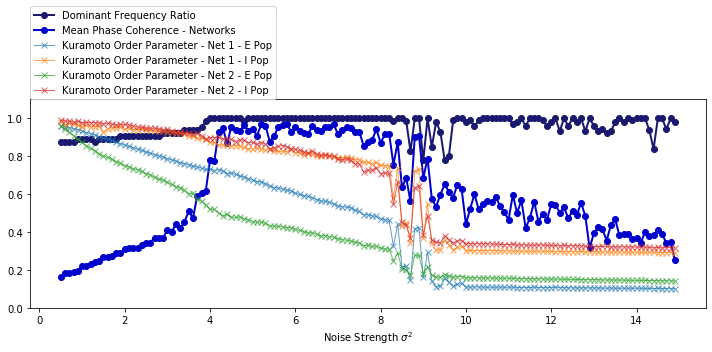

In [6]:
import pprint

plots.plot_exploration(ex, vmin_ratio=None, vmin_phase=None, vmax_phase=None, folder="PING_all_to_all")
pprint.pprint(ex.default_params)

## Exploration over noise strength and ratio - 2d

In [3]:
exp_params = {
    "poisson_variance": np.arange(0.5, 15.0, 0.5),
    "poisson_p": np.arange(0.7, 1.0, 0.05),
}

ov_params = dict(params)
ov_params.update({
    "runtime": 3000.0,
})

ex = mopet.Exploration(
    runner.run_in_mopet, 
    explore_params=exp_params, 
    default_params=ov_params,
    hdf_filename=constants.MODELS_PATH + "/PING_synch_noise.h5",
    exploration_name="08-10-2"
)

In [4]:
ex.run()

2020-10-08 15:35:51,628	INFO resource_spec.py:212 -- Starting Ray with 11.13 GiB memory available for workers and up to 5.59 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-10-08 15:35:51,851	WARNING services.py:923 -- Redis failed to start, retrying now.
2020-10-08 15:35:52,101	INFO services.py:1165 -- View the Ray dashboard at localhost:8265
INFO:root:Starting 203 jobs.
100%|██████████| 203/203 [00:00<00:00, 226.83it/s]
INFO:root:Runs took 0.8999662399291992 s to submit.
WARNING    /Users/lrebscher/git/Synchronization-by-Uncorrelated-Noise/venv/lib/python3.7/site-packages/tables/path.py:155: NaturalNameWarning: object name is not a valid Python identifier: '08-10-2'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 [py.warnings]
  check_attribute_name(name)

  0%|         

(pid=56476) Starting simulation at t=0. s for a duration of 3. s
(pid=56476) 287. ms (9%) simulated in 10s, estimated 1m 35s remaining.
(pid=56476) 0.562 s (18%) simulated in 20s, estimated 1m 27s remaining.
(pid=56473) Starting simulation at t=0. s for a duration of 3. s
(pid=56480) Starting simulation at t=0. s for a duration of 3. s
(pid=56472) Starting simulation at t=0. s for a duration of 3. s
(pid=56475) Starting simulation at t=0. s for a duration of 3. s
(pid=56478) Starting simulation at t=0. s for a duration of 3. s
(pid=56476) 0.8354 s (27%) simulated in 30s, estimated 1m 18s remaining.
(pid=56477) Starting simulation at t=0. s for a duration of 3. s
(pid=56481) Starting simulation at t=0. s for a duration of 3. s
(pid=56482) Starting simulation at t=0. s for a duration of 3. s
(pid=56473) 244.5 ms (8%) simulated in 10s, estimated 1m 53s remaining.
(pid=56479) Starting simulation at t=0. s for a duration of 3. s
(pid=56483) Starting simulation at t=0. s for a duration of 3.

  2%|▏         | 5/203 [03:04<2:25:59, 44.24s/it]  

(pid=56476) 0.5396 s (17%) simulated in 20s, estimated 1m 31s remaining.


  6%|▌         | 12/203 [03:17<14:07,  4.44s/it] 

(pid=56478) Starting simulation at t=0. s for a duration of 3. s
(pid=56477) Starting simulation at t=0. s for a duration of 3. s
(pid=56473) Starting simulation at t=0. s for a duration of 3. s
(pid=56480) Starting simulation at t=0. s for a duration of 3. s
(pid=56476) 0.84895 s (28%) simulated in 30s, estimated 1m 16s remaining.
(pid=56479) Starting simulation at t=0. s for a duration of 3. s
(pid=56472) Starting simulation at t=0. s for a duration of 3. s
(pid=56474) Starting simulation at t=0. s for a duration of 3. s
(pid=56482) Starting simulation at t=0. s for a duration of 3. s
(pid=56483) Starting simulation at t=0. s for a duration of 3. s
(pid=56478) 294.55 ms (9%) simulated in 10s, estimated 1m 32s remaining.
(pid=56477) 301.8 ms (10%) simulated in 10s, estimated 1m 29s remaining.
(pid=56473) 307.25 ms (10%) simulated in 10s, estimated 1m 28s remaining.
(pid=56480) 305.8 ms (10%) simulated in 10s, estimated 1m 28s remaining.
(pid=56476) 1.15055 s (38%) simulated in 40s, es

  6%|▋         | 13/203 [05:04<1:51:32, 35.23s/it]

(pid=56482) 3. s (100%) simulated in 1m 36s
(pid=56474) 3. s (100%) simulated in 1m 37s
(pid=56487) 2.1213 s (70%) simulated in 1m 10s, estimated 29s remaining.
(pid=56483) 3. s (100%) simulated in 1m 37s
(pid=56488) 2.6531 s (88%) simulated in 1m 30s, estimated 12s remaining.
(pid=56487) 2.42565 s (80%) simulated in 1m 20s, estimated 19s remaining.
(pid=56488) 2.94655 s (98%) simulated in 1m 40s, estimated 2s remaining.
(pid=56488) 3. s (100%) simulated in 1m 41s
(pid=56487) 2.71275 s (90%) simulated in 1m 30s, estimated 10s remaining.
(pid=56476) Starting simulation at t=0. s for a duration of 3. s
(pid=56487) 2.99915 s (99%) simulated in 1m 40s, estimated < 1s remaining.
(pid=56487) 3. s (100%) simulated in 1m 40s
(pid=56476) 294.8 ms (9%) simulated in 10s, estimated 1m 32s remaining.
(pid=56477) Starting simulation at t=0. s for a duration of 3. s
(pid=56473) Starting simulation at t=0. s for a duration of 3. s
(pid=56480) Starting simulation at t=0. s for a duration of 3. s
(pid=5

  9%|▉         | 19/203 [05:55<21:25,  6.99s/it]  

(pid=56474) Starting simulation at t=0. s for a duration of 3. s
(pid=56479) Starting simulation at t=0. s for a duration of 3. s
(pid=56472) Starting simulation at t=0. s for a duration of 3. s
(pid=56482) Starting simulation at t=0. s for a duration of 3. s
(pid=56476) 0.9836 s (32%) simulated in 30s, estimated 1m 2s remaining.
(pid=56477) 0.66885 s (22%) simulated in 20s, estimated 1m 10s remaining.
(pid=56478) 306.35 ms (10%) simulated in 10s, estimated 1m 28s remaining.
(pid=56473) 0.6813 s (22%) simulated in 20s, estimated 1m 8s remaining.
(pid=56483) 296.15 ms (9%) simulated in 10s, estimated 1m 31s remaining.
(pid=56480) 0.66865 s (22%) simulated in 20s, estimated 1m 10s remaining.


 10%|▉         | 20/203 [06:04<23:27,  7.69s/it]

(pid=56488) Starting simulation at t=0. s for a duration of 3. s


 11%|█         | 22/203 [06:05<12:02,  3.99s/it]

(pid=56474) 310.25 ms (10%) simulated in 10s, estimated 1m 27s remaining.
(pid=56479) 305.5 ms (10%) simulated in 10s, estimated 1m 28s remaining.


 11%|█▏        | 23/203 [06:06<08:48,  2.94s/it]

(pid=56472) 307.6 ms (10%) simulated in 10s, estimated 1m 28s remaining.
(pid=56482) 310.55 ms (10%) simulated in 10s, estimated 1m 27s remaining.


 12%|█▏        | 24/203 [06:06<06:31,  2.19s/it]

(pid=56476) 1.2955 s (43%) simulated in 40s, estimated 53s remaining.
(pid=56477) 0.9838 s (32%) simulated in 30s, estimated 1m 1s remaining.
(pid=56478) 0.6126 s (20%) simulated in 20s, estimated 1m 18s remaining.
(pid=56473) 0.98725 s (32%) simulated in 30s, estimated 1m 1s remaining.
(pid=56483) 0.5965 s (19%) simulated in 20s, estimated 1m 21s remaining.
(pid=56480) 0.9759 s (32%) simulated in 30s, estimated 1m 2s remaining.
(pid=56488) 307.5 ms (10%) simulated in 10s, estimated 1m 28s remaining.
(pid=56474) 0.62715 s (20%) simulated in 20s, estimated 1m 16s remaining.
(pid=56479) 0.6187 s (20%) simulated in 20s, estimated 1m 17s remaining.
(pid=56472) 0.6242 s (20%) simulated in 20s, estimated 1m 16s remaining.
(pid=56482) 0.63275 s (21%) simulated in 20s, estimated 1m 15s remaining.
(pid=56476) 1.62145 s (54%) simulated in 50s, estimated 43s remaining.
(pid=56477) 1.3014 s (43%) simulated in 40s, estimated 52s remaining.
(pid=56478) 0.94645 s (31%) simulated in 30s, estimated 1m 

 12%|█▏        | 25/203 [07:30<1:18:56, 26.61s/it]

(pid=56479) 3. s (100%) simulated in 1m 34s
(pid=56487) 2.28415 s (76%) simulated in 1m 10s, estimated 22s remaining.
(pid=56488) 2.90755 s (96%) simulated in 1m 30s, estimated 3s remaining.
(pid=56488) 3. s (100%) simulated in 1m 32s
(pid=56487) 2.60055 s (86%) simulated in 1m 20s, estimated 12s remaining.


 14%|█▍        | 28/203 [07:47<34:49, 11.94s/it]  

(pid=56476) Starting simulation at t=0. s for a duration of 3. s


 14%|█▍        | 29/203 [07:54<30:06, 10.38s/it]

(pid=56487) 2.8778 s (95%) simulated in 1m 30s, estimated 4s remaining.
(pid=56477) Starting simulation at t=0. s for a duration of 3. s
(pid=56487) 3. s (100%) simulated in 1m 34s
(pid=56473) Starting simulation at t=0. s for a duration of 3. s


 15%|█▍        | 30/203 [08:00<26:27,  9.18s/it]

(pid=56480) Starting simulation at t=0. s for a duration of 3. s
(pid=56476) 262.45 ms (8%) simulated in 10s, estimated 1m 44s remaining.


 17%|█▋        | 34/203 [08:05<08:03,  2.86s/it]

(pid=56478) Starting simulation at t=0. s for a duration of 3. s
(pid=56477) 297.7 ms (9%) simulated in 10s, estimated 1m 31s remaining.
(pid=56473) 301.7 ms (10%) simulated in 10s, estimated 1m 29s remaining.
(pid=56480) 0.3222 s (10%) simulated in 10s, estimated 1m 23s remaining.


 17%|█▋        | 35/203 [08:12<11:24,  4.08s/it]

(pid=56476) 0.59725 s (19%) simulated in 20s, estimated 1m 20s remaining.
(pid=56478) 0.34855 s (11%) simulated in 10s, estimated 1m 16s remaining.
(pid=56477) 0.6467 s (21%) simulated in 20s, estimated 1m 13s remaining.
(pid=56473) 0.65535 s (21%) simulated in 20s, estimated 1m 12s remaining.
(pid=56482) Starting simulation at t=0. s for a duration of 3. s
(pid=56483) Starting simulation at t=0. s for a duration of 3. s
(pid=56480) 0.66015 s (22%) simulated in 20s, estimated 1m 11s remaining.
(pid=56479) Starting simulation at t=0. s for a duration of 3. s
(pid=56472) Starting simulation at t=0. s for a duration of 3. s
(pid=56474) Starting simulation at t=0. s for a duration of 3. s
(pid=56476) 0.9397 s (31%) simulated in 30s, estimated 1m 6s remaining.


 18%|█▊        | 36/203 [08:25<19:06,  6.86s/it]

(pid=56478) 0.67405 s (22%) simulated in 20s, estimated 1m 9s remaining.
(pid=56477) 0.9768 s (32%) simulated in 30s, estimated 1m 2s remaining.
(pid=56473) 0.99045 s (33%) simulated in 30s, estimated 1m 1s remaining.
(pid=56482) 0.32875 s (10%) simulated in 10s, estimated 1m 21s remaining.
(pid=56483) 0.3314 s (11%) simulated in 10s, estimated 1m 21s remaining.
(pid=56488) Starting simulation at t=0. s for a duration of 3. s
(pid=56480) 0.9977 s (33%) simulated in 30s, estimated 1m 0s remaining.
(pid=56479) 0.32535 s (10%) simulated in 10s, estimated 1m 22s remaining.
(pid=56472) 0.32925 s (10%) simulated in 10s, estimated 1m 21s remaining.
(pid=56474) 0.3331 s (11%) simulated in 10s, estimated 1m 20s remaining.
(pid=56476) 1.27695 s (42%) simulated in 40s, estimated 54s remaining.
(pid=56478) 1.00505 s (33%) simulated in 30s, estimated 1m 0s remaining.
(pid=56477) 1.31205 s (43%) simulated in 40s, estimated 51s remaining.
(pid=56473) 1.33085 s (44%) simulated in 40s, estimated 50s re

 18%|█▊        | 37/203 [09:57<1:29:27, 32.33s/it]

(pid=56474) 3. s (100%) simulated in 1m 34s
(pid=56472) 3. s (100%) simulated in 1m 35s
(pid=56479) 3. s (100%) simulated in 1m 36s
(pid=56488) 2.76985 s (92%) simulated in 1m 30s, estimated 7s remaining.
(pid=56487) 2.40305 s (80%) simulated in 1m 20s, estimated 20s remaining.


 19%|█▉        | 39/203 [10:06<48:27, 17.73s/it]  

(pid=56488) 3. s (100%) simulated in 1m 37s


 20%|█▉        | 40/203 [10:08<35:44, 13.15s/it]

(pid=56487) 2.73395 s (91%) simulated in 1m 30s, estimated 9s remaining.


 20%|██        | 41/203 [10:16<30:56, 11.46s/it]

(pid=56476) Starting simulation at t=0. s for a duration of 3. s
(pid=56487) 3. s (100%) simulated in 1m 37s
(pid=56480) Starting simulation at t=0. s for a duration of 3. s
(pid=56477) Starting simulation at t=0. s for a duration of 3. s
(pid=56473) Starting simulation at t=0. s for a duration of 3. s
(pid=56478) Starting simulation at t=0. s for a duration of 3. s


 22%|██▏       | 45/203 [10:29<11:12,  4.26s/it]

(pid=56476) 0.3208 s (10%) simulated in 10s, estimated 1m 24s remaining.


 23%|██▎       | 46/203 [10:29<08:10,  3.12s/it]

(pid=56480) 0.35655 s (11%) simulated in 10s, estimated 1m 14s remaining.
(pid=56477) 0.3585 s (11%) simulated in 10s, estimated 1m 14s remaining.
(pid=56483) Starting simulation at t=0. s for a duration of 3. s


 23%|██▎       | 47/203 [10:35<10:36,  4.08s/it]

(pid=56473) 0.3617 s (12%) simulated in 10s, estimated 1m 13s remaining.
(pid=56478) 0.3598 s (11%) simulated in 10s, estimated 1m 13s remaining.
(pid=56476) 0.6956 s (23%) simulated in 20s, estimated 1m 6s remaining.
(pid=56474) Starting simulation at t=0. s for a duration of 3. s
(pid=56472) Starting simulation at t=0. s for a duration of 3. s
(pid=56480) 0.70025 s (23%) simulated in 20s, estimated 1m 6s remaining.
(pid=56477) 0.70415 s (23%) simulated in 20s, estimated 1m 5s remaining.
(pid=56483) 0.34015 s (11%) simulated in 10s, estimated 1m 18s remaining.
(pid=56473) 0.70935 s (23%) simulated in 20s, estimated 1m 5s remaining.
(pid=56482) Starting simulation at t=0. s for a duration of 3. s
(pid=56479) Starting simulation at t=0. s for a duration of 3. s
(pid=56478) 0.6879 s (22%) simulated in 20s, estimated 1m 7s remaining.
(pid=56476) 1.02755 s (34%) simulated in 30s, estimated 58s remaining.


 24%|██▎       | 48/203 [10:49<18:04,  7.00s/it]

(pid=56474) 0.33395 s (11%) simulated in 10s, estimated 1m 20s remaining.
(pid=56488) Starting simulation at t=0. s for a duration of 3. s
(pid=56472) 0.33225 s (11%) simulated in 10s, estimated 1m 20s remaining.
(pid=56480) 1.0379 s (34%) simulated in 30s, estimated 57s remaining.
(pid=56477) 1.03925 s (34%) simulated in 30s, estimated 57s remaining.
(pid=56483) 0.6819 s (22%) simulated in 20s, estimated 1m 8s remaining.
(pid=56473) 1.05175 s (35%) simulated in 30s, estimated 56s remaining.
(pid=56482) 0.3385 s (11%) simulated in 10s, estimated 1m 19s remaining.
(pid=56479) 0.33555 s (11%) simulated in 10s, estimated 1m 19s remaining.
(pid=56478) 1.02405 s (34%) simulated in 30s, estimated 58s remaining.
(pid=56476) 1.36675 s (45%) simulated in 40s, estimated 48s remaining.
(pid=56474) 0.67615 s (22%) simulated in 20s, estimated 1m 9s remaining.
(pid=56488) 0.3362 s (11%) simulated in 10s, estimated 1m 19s remaining.
(pid=56472) 0.6713 s (22%) simulated in 20s, estimated 1m 9s remaini

 24%|██▍       | 49/203 [12:24<1:25:25, 33.28s/it]

(pid=56488) 2.82825 s (94%) simulated in 1m 30s, estimated 5s remaining.


 26%|██▌       | 52/203 [12:28<30:33, 12.15s/it]  

(pid=56487) 2.47615 s (82%) simulated in 1m 20s, estimated 17s remaining.
(pid=56488) 3. s (100%) simulated in 1m 35s


 26%|██▌       | 53/203 [12:31<23:48,  9.52s/it]

(pid=56487) 2.86075 s (95%) simulated in 1m 30s, estimated 4s remaining.


 27%|██▋       | 54/203 [12:39<22:08,  8.92s/it]

(pid=56487) 3. s (100%) simulated in 1m 34s
(pid=56473) Starting simulation at t=0. s for a duration of 3. s
(pid=56476) Starting simulation at t=0. s for a duration of 3. s
(pid=56477) Starting simulation at t=0. s for a duration of 3. s
(pid=56478) Starting simulation at t=0. s for a duration of 3. s
(pid=56480) Starting simulation at t=0. s for a duration of 3. s


 28%|██▊       | 56/203 [12:50<17:04,  6.97s/it]

(pid=56483) Starting simulation at t=0. s for a duration of 3. s


 29%|██▊       | 58/203 [12:51<08:43,  3.61s/it]

(pid=56473) 0.3503 s (11%) simulated in 10s, estimated 1m 16s remaining.
(pid=56476) 0.35565 s (11%) simulated in 10s, estimated 1m 14s remaining.
(pid=56477) 0.35285 s (11%) simulated in 10s, estimated 1m 15s remaining.


 29%|██▉       | 59/203 [12:54<08:40,  3.62s/it]

(pid=56478) 0.3675 s (12%) simulated in 10s, estimated 1m 12s remaining.
(pid=56480) 0.36895 s (12%) simulated in 10s, estimated 1m 11s remaining.
(pid=56483) 0.37385 s (12%) simulated in 10s, estimated 1m 10s remaining.
(pid=56473) 0.7153 s (23%) simulated in 20s, estimated 1m 4s remaining.
(pid=56472) Starting simulation at t=0. s for a duration of 3. s
(pid=56482) Starting simulation at t=0. s for a duration of 3. s
(pid=56476) 0.7171 s (23%) simulated in 20s, estimated 1m 4s remaining.
(pid=56479) Starting simulation at t=0. s for a duration of 3. s
(pid=56477) 0.70835 s (23%) simulated in 20s, estimated 1m 5s remaining.
(pid=56474) Starting simulation at t=0. s for a duration of 3. s
(pid=56478) 0.70185 s (23%) simulated in 20s, estimated 1m 5s remaining.
(pid=56480) 0.70595 s (23%) simulated in 20s, estimated 1m 5s remaining.


 30%|██▉       | 60/203 [13:08<15:56,  6.69s/it]

(pid=56483) 0.6989 s (23%) simulated in 20s, estimated 1m 6s remaining.
(pid=56472) 309.8 ms (10%) simulated in 10s, estimated 1m 27s remaining.
(pid=56473) 1.032 s (34%) simulated in 30s, estimated 57s remaining.
(pid=56482) 315.85 ms (10%) simulated in 10s, estimated 1m 25s remaining.
(pid=56476) 1.0357 s (34%) simulated in 30s, estimated 57s remaining.
(pid=56488) Starting simulation at t=0. s for a duration of 3. s
(pid=56479) 309.5 ms (10%) simulated in 10s, estimated 1m 27s remaining.
(pid=56477) 1.02475 s (34%) simulated in 30s, estimated 58s remaining.
(pid=56474) 311.05 ms (10%) simulated in 10s, estimated 1m 26s remaining.
(pid=56478) 1.0181 s (33%) simulated in 30s, estimated 58s remaining.
(pid=56480) 1.0219 s (34%) simulated in 30s, estimated 58s remaining.
(pid=56483) 1.0191 s (33%) simulated in 30s, estimated 58s remaining.
(pid=56473) 1.36 s (45%) simulated in 40s, estimated 48s remaining.
(pid=56472) 0.6345 s (21%) simulated in 20s, estimated 1m 15s remaining.
(pid=564

 30%|███       | 61/203 [14:45<1:20:00, 33.81s/it]

(pid=56488) 3. s (100%) simulated in 1m 33s


 32%|███▏      | 64/203 [14:48<28:00, 12.09s/it]  

(pid=56487) 2.5586 s (85%) simulated in 1m 20s, estimated 14s remaining.


 33%|███▎      | 66/203 [14:51<15:51,  6.94s/it]

(pid=56487) 2.97975 s (99%) simulated in 1m 30s, estimated 1s remaining.
(pid=56487) 3. s (100%) simulated in 1m 30s


 33%|███▎      | 67/203 [15:03<18:38,  8.23s/it]

(pid=56473) Starting simulation at t=0. s for a duration of 3. s


 33%|███▎      | 68/203 [15:04<13:48,  6.13s/it]

(pid=56477) Starting simulation at t=0. s for a duration of 3. s
(pid=56478) Starting simulation at t=0. s for a duration of 3. s
(pid=56476) Starting simulation at t=0. s for a duration of 3. s


 34%|███▍      | 69/203 [15:04<09:57,  4.46s/it]

(pid=56480) Starting simulation at t=0. s for a duration of 3. s


 34%|███▍      | 70/203 [15:06<07:37,  3.44s/it]

(pid=56483) Starting simulation at t=0. s for a duration of 3. s


 35%|███▍      | 71/203 [15:09<07:53,  3.59s/it]

(pid=56473) 0.38015 s (12%) simulated in 10s, estimated 1m 9s remaining.
(pid=56477) 0.37805 s (12%) simulated in 10s, estimated 1m 9s remaining.
(pid=56478) 0.37705 s (12%) simulated in 10s, estimated 1m 10s remaining.
(pid=56476) 0.3872 s (12%) simulated in 10s, estimated 1m 7s remaining.
(pid=56480) 0.374 s (12%) simulated in 10s, estimated 1m 10s remaining.
(pid=56483) 0.37925 s (12%) simulated in 10s, estimated 1m 9s remaining.
(pid=56474) Starting simulation at t=0. s for a duration of 3. s
(pid=56472) Starting simulation at t=0. s for a duration of 3. s
(pid=56482) Starting simulation at t=0. s for a duration of 3. s
(pid=56479) Starting simulation at t=0. s for a duration of 3. s


 35%|███▌      | 72/203 [15:22<13:54,  6.37s/it]

(pid=56473) 0.7209 s (24%) simulated in 20s, estimated 1m 3s remaining.
(pid=56477) 0.7151 s (23%) simulated in 20s, estimated 1m 4s remaining.
(pid=56478) 0.7104 s (23%) simulated in 20s, estimated 1m 4s remaining.
(pid=56476) 0.7306 s (24%) simulated in 20s, estimated 1m 2s remaining.
(pid=56480) 0.7119 s (23%) simulated in 20s, estimated 1m 4s remaining.
(pid=56488) Starting simulation at t=0. s for a duration of 3. s
(pid=56483) 0.71815 s (23%) simulated in 20s, estimated 1m 4s remaining.
(pid=56474) 0.33635 s (11%) simulated in 10s, estimated 1m 19s remaining.
(pid=56472) 0.33555 s (11%) simulated in 10s, estimated 1m 19s remaining.
(pid=56482) 0.335 s (11%) simulated in 10s, estimated 1m 20s remaining.
(pid=56479) 0.33235 s (11%) simulated in 10s, estimated 1m 20s remaining.
(pid=56473) 1.0641 s (35%) simulated in 30s, estimated 55s remaining.
(pid=56477) 1.0586 s (35%) simulated in 30s, estimated 55s remaining.
(pid=56478) 1.0485 s (34%) simulated in 30s, estimated 56s remaining

 38%|███▊      | 78/203 [17:07<13:32,  6.50s/it]  

(pid=56487) 2.92885 s (97%) simulated in 1m 30s, estimated 2s remaining.
(pid=56487) 3. s (100%) simulated in 1m 31s


 40%|████      | 82/203 [17:21<06:19,  3.13s/it]

(pid=56480) Starting simulation at t=0. s for a duration of 3. s
(pid=56473) Starting simulation at t=0. s for a duration of 3. s
(pid=56478) Starting simulation at t=0. s for a duration of 3. s
(pid=56477) Starting simulation at t=0. s for a duration of 3. s
(pid=56483) Starting simulation at t=0. s for a duration of 3. s
(pid=56476) Starting simulation at t=0. s for a duration of 3. s


 41%|████      | 83/203 [17:26<07:48,  3.90s/it]

(pid=56480) 0.3689 s (12%) simulated in 10s, estimated 1m 11s remaining.
(pid=56473) 0.37275 s (12%) simulated in 10s, estimated 1m 10s remaining.
(pid=56478) 0.36775 s (12%) simulated in 10s, estimated 1m 12s remaining.
(pid=56477) 0.36485 s (12%) simulated in 10s, estimated 1m 12s remaining.
(pid=56483) 0.37075 s (12%) simulated in 10s, estimated 1m 11s remaining.
(pid=56476) 0.3752 s (12%) simulated in 10s, estimated 1m 10s remaining.
(pid=56482) Starting simulation at t=0. s for a duration of 3. s
(pid=56472) Starting simulation at t=0. s for a duration of 3. s
(pid=56474) Starting simulation at t=0. s for a duration of 3. s
(pid=56479) Starting simulation at t=0. s for a duration of 3. s


 41%|████▏     | 84/203 [17:40<13:27,  6.79s/it]

(pid=56480) 0.70685 s (23%) simulated in 20s, estimated 1m 5s remaining.
(pid=56473) 0.71 s (23%) simulated in 20s, estimated 1m 5s remaining.
(pid=56478) 0.7059 s (23%) simulated in 20s, estimated 1m 5s remaining.
(pid=56477) 0.7007 s (23%) simulated in 20s, estimated 1m 6s remaining.
(pid=56483) 0.7093 s (23%) simulated in 20s, estimated 1m 5s remaining.
(pid=56476) 0.71935 s (23%) simulated in 20s, estimated 1m 3s remaining.
(pid=56488) Starting simulation at t=0. s for a duration of 3. s
(pid=56482) 0.33235 s (11%) simulated in 10s, estimated 1m 20s remaining.
(pid=56472) 0.33045 s (11%) simulated in 10s, estimated 1m 21s remaining.
(pid=56474) 0.33925 s (11%) simulated in 10s, estimated 1m 18s remaining.
(pid=56479) 0.33105 s (11%) simulated in 10s, estimated 1m 21s remaining.
(pid=56480) 1.0526 s (35%) simulated in 30s, estimated 56s remaining.
(pid=56473) 1.0576 s (35%) simulated in 30s, estimated 55s remaining.
(pid=56478) 1.05325 s (35%) simulated in 30s, estimated 55s remaini

 42%|████▏     | 85/203 [19:18<1:07:07, 34.13s/it]

(pid=56487) 2.6258 s (87%) simulated in 1m 20s, estimated 11s remaining.


 44%|████▍     | 90/203 [19:22<11:50,  6.29s/it]  

(pid=56487) 3. s (100%) simulated in 1m 29s


 45%|████▌     | 92/203 [19:36<11:13,  6.06s/it]

(pid=56480) Starting simulation at t=0. s for a duration of 3. s


 46%|████▌     | 93/203 [19:37<08:01,  4.38s/it]

(pid=56476) Starting simulation at t=0. s for a duration of 3. s


 46%|████▋     | 94/203 [19:37<05:54,  3.25s/it]

(pid=56478) Starting simulation at t=0. s for a duration of 3. s
(pid=56473) Starting simulation at t=0. s for a duration of 3. s
(pid=56483) Starting simulation at t=0. s for a duration of 3. s
(pid=56477) Starting simulation at t=0. s for a duration of 3. s


 47%|████▋     | 95/203 [19:42<06:22,  3.54s/it]

(pid=56480) 0.33215 s (11%) simulated in 10s, estimated 1m 20s remaining.
(pid=56476) 0.3432 s (11%) simulated in 10s, estimated 1m 17s remaining.
(pid=56478) 0.3403 s (11%) simulated in 10s, estimated 1m 18s remaining.
(pid=56473) 0.3483 s (11%) simulated in 10s, estimated 1m 16s remaining.
(pid=56483) 0.34145 s (11%) simulated in 10s, estimated 1m 18s remaining.
(pid=56477) 0.3483 s (11%) simulated in 10s, estimated 1m 16s remaining.
(pid=56472) Starting simulation at t=0. s for a duration of 3. s
(pid=56479) Starting simulation at t=0. s for a duration of 3. s
(pid=56474) Starting simulation at t=0. s for a duration of 3. s
(pid=56482) Starting simulation at t=0. s for a duration of 3. s
(pid=56480) 0.63095 s (21%) simulated in 20s, estimated 1m 15s remaining.
(pid=56476) 0.6453 s (21%) simulated in 20s, estimated 1m 13s remaining.


 47%|████▋     | 96/203 [19:57<12:47,  7.17s/it]

(pid=56478) 0.63335 s (21%) simulated in 20s, estimated 1m 15s remaining.
(pid=56473) 0.6439 s (21%) simulated in 20s, estimated 1m 13s remaining.
(pid=56483) 0.63075 s (21%) simulated in 20s, estimated 1m 15s remaining.
(pid=56477) 0.63825 s (21%) simulated in 20s, estimated 1m 14s remaining.
(pid=56488) Starting simulation at t=0. s for a duration of 3. s
(pid=56472) 292.2 ms (9%) simulated in 10s, estimated 1m 33s remaining.
(pid=56479) 290.6 ms (9%) simulated in 10s, estimated 1m 33s remaining.
(pid=56474) 294.45 ms (9%) simulated in 10s, estimated 1m 32s remaining.
(pid=56482) 304.15 ms (10%) simulated in 10s, estimated 1m 29s remaining.
(pid=56480) 0.93675 s (31%) simulated in 30s, estimated 1m 6s remaining.
(pid=56476) 0.95805 s (31%) simulated in 30s, estimated 1m 4s remaining.
(pid=56478) 0.94875 s (31%) simulated in 30s, estimated 1m 5s remaining.
(pid=56473) 0.9659 s (32%) simulated in 30s, estimated 1m 3s remaining.
(pid=56483) 0.95005 s (31%) simulated in 30s, estimated 1m

 49%|████▉     | 99/203 [21:37<30:00, 17.31s/it]  

(pid=56487) 2.81605 s (93%) simulated in 1m 20s, estimated 5s remaining.


 50%|█████     | 102/203 [21:38<10:26,  6.20s/it]

(pid=56487) 3. s (100%) simulated in 1m 24s


 52%|█████▏    | 106/203 [21:49<04:30,  2.79s/it]

(pid=56478) Starting simulation at t=0. s for a duration of 3. s
(pid=56477) Starting simulation at t=0. s for a duration of 3. s
(pid=56473) Starting simulation at t=0. s for a duration of 3. s


 53%|█████▎    | 107/203 [21:51<04:12,  2.63s/it]

(pid=56476) Starting simulation at t=0. s for a duration of 3. s
(pid=56483) Starting simulation at t=0. s for a duration of 3. s
(pid=56480) Starting simulation at t=0. s for a duration of 3. s
(pid=56478) 0.38695 s (12%) simulated in 10s, estimated 1m 8s remaining.
(pid=56477) 0.39135 s (13%) simulated in 10s, estimated 1m 7s remaining.
(pid=56473) 0.38845 s (12%) simulated in 10s, estimated 1m 7s remaining.
(pid=56476) 0.39295 s (13%) simulated in 10s, estimated 1m 6s remaining.
(pid=56483) 0.37375 s (12%) simulated in 10s, estimated 1m 10s remaining.
(pid=56480) 0.3697 s (12%) simulated in 10s, estimated 1m 11s remaining.
(pid=56472) Starting simulation at t=0. s for a duration of 3. s


 53%|█████▎    | 108/203 [22:04<08:59,  5.68s/it]

(pid=56479) Starting simulation at t=0. s for a duration of 3. s
(pid=56474) Starting simulation at t=0. s for a duration of 3. s
(pid=56482) Starting simulation at t=0. s for a duration of 3. s
(pid=56488) Starting simulation at t=0. s for a duration of 3. s
(pid=56478) 0.72235 s (24%) simulated in 20s, estimated 1m 3s remaining.
(pid=56477) 0.72825 s (24%) simulated in 20s, estimated 1m 2s remaining.
(pid=56473) 0.7295 s (24%) simulated in 20s, estimated 1m 2s remaining.
(pid=56476) 0.7333 s (24%) simulated in 20s, estimated 1m 2s remaining.
(pid=56483) 0.7166 s (23%) simulated in 20s, estimated 1m 4s remaining.
(pid=56480) 0.71 s (23%) simulated in 20s, estimated 1m 5s remaining.
(pid=56472) 0.32675 s (10%) simulated in 10s, estimated 1m 22s remaining.
(pid=56479) 0.3379 s (11%) simulated in 10s, estimated 1m 19s remaining.
(pid=56474) 0.34035 s (11%) simulated in 10s, estimated 1m 18s remaining.
(pid=56482) 0.34285 s (11%) simulated in 10s, estimated 1m 18s remaining.
(pid=56488) 0

 54%|█████▎    | 109/203 [23:42<52:28, 33.49s/it]

(pid=56487) 2.822 s (94%) simulated in 1m 20s, estimated 5s remaining.


 56%|█████▌    | 114/203 [23:45<08:58,  6.06s/it]

(pid=56487) 3. s (100%) simulated in 1m 25s


 59%|█████▊    | 119/203 [23:59<04:12,  3.00s/it]

(pid=56476) Starting simulation at t=0. s for a duration of 3. s
(pid=56477) Starting simulation at t=0. s for a duration of 3. s
(pid=56478) Starting simulation at t=0. s for a duration of 3. s
(pid=56480) Starting simulation at t=0. s for a duration of 3. s
(pid=56483) Starting simulation at t=0. s for a duration of 3. s
(pid=56473) Starting simulation at t=0. s for a duration of 3. s


 59%|█████▉    | 120/203 [24:07<06:03,  4.38s/it]

(pid=56476) 0.38425 s (12%) simulated in 10s, estimated 1m 8s remaining.
(pid=56477) 0.3728 s (12%) simulated in 10s, estimated 1m 10s remaining.
(pid=56478) 0.36305 s (12%) simulated in 10s, estimated 1m 13s remaining.
(pid=56472) Starting simulation at t=0. s for a duration of 3. s
(pid=56480) 0.3681 s (12%) simulated in 10s, estimated 1m 12s remaining.
(pid=56479) Starting simulation at t=0. s for a duration of 3. s
(pid=56483) 0.3654 s (12%) simulated in 10s, estimated 1m 12s remaining.
(pid=56474) Starting simulation at t=0. s for a duration of 3. s
(pid=56473) 0.3657 s (12%) simulated in 10s, estimated 1m 12s remaining.
(pid=56482) Starting simulation at t=0. s for a duration of 3. s
(pid=56488) Starting simulation at t=0. s for a duration of 3. s
(pid=56476) 0.7477 s (24%) simulated in 20s, estimated 1m 0s remaining.
(pid=56477) 0.73535 s (24%) simulated in 20s, estimated 1m 2s remaining.
(pid=56478) 0.72455 s (24%) simulated in 20s, estimated 1m 3s remaining.
(pid=56472) 0.3531

 65%|██████▍   | 131/203 [26:07<03:57,  3.29s/it]

(pid=56477) Starting simulation at t=0. s for a duration of 3. s
(pid=56478) Starting simulation at t=0. s for a duration of 3. s
(pid=56483) Starting simulation at t=0. s for a duration of 3. s
(pid=56480) Starting simulation at t=0. s for a duration of 3. s
(pid=56473) Starting simulation at t=0. s for a duration of 3. s
(pid=56476) Starting simulation at t=0. s for a duration of 3. s


 65%|██████▌   | 132/203 [26:15<05:14,  4.43s/it]

(pid=56474) Starting simulation at t=0. s for a duration of 3. s
(pid=56477) 0.33695 s (11%) simulated in 10s, estimated 1m 19s remaining.
(pid=56482) Starting simulation at t=0. s for a duration of 3. s
(pid=56478) 0.3306 s (11%) simulated in 10s, estimated 1m 21s remaining.
(pid=56483) 0.33825 s (11%) simulated in 10s, estimated 1m 19s remaining.
(pid=56479) Starting simulation at t=0. s for a duration of 3. s
(pid=56480) 0.3288 s (10%) simulated in 10s, estimated 1m 21s remaining.
(pid=56473) 0.33465 s (11%) simulated in 10s, estimated 1m 20s remaining.
(pid=56472) Starting simulation at t=0. s for a duration of 3. s
(pid=56476) 0.3381 s (11%) simulated in 10s, estimated 1m 19s remaining.
(pid=56488) Starting simulation at t=0. s for a duration of 3. s
(pid=56474) 0.32135 s (10%) simulated in 10s, estimated 1m 23s remaining.
(pid=56477) 0.65965 s (21%) simulated in 20s, estimated 1m 11s remaining.
(pid=56482) 0.32635 s (10%) simulated in 10s, estimated 1m 22s remaining.
(pid=56478) 

 70%|███████   | 143/203 [28:18<02:38,  2.64s/it]

(pid=56473) Starting simulation at t=0. s for a duration of 3. s
(pid=56476) Starting simulation at t=0. s for a duration of 3. s
(pid=56478) Starting simulation at t=0. s for a duration of 3. s
(pid=56483) Starting simulation at t=0. s for a duration of 3. s
(pid=56480) Starting simulation at t=0. s for a duration of 3. s
(pid=56477) Starting simulation at t=0. s for a duration of 3. s


 71%|███████   | 144/203 [28:24<03:45,  3.82s/it]

(pid=56474) Starting simulation at t=0. s for a duration of 3. s
(pid=56472) Starting simulation at t=0. s for a duration of 3. s
(pid=56482) Starting simulation at t=0. s for a duration of 3. s
(pid=56479) Starting simulation at t=0. s for a duration of 3. s
(pid=56473) 0.3615 s (12%) simulated in 10s, estimated 1m 13s remaining.
(pid=56476) 0.3589 s (11%) simulated in 10s, estimated 1m 14s remaining.
(pid=56478) 0.3458 s (11%) simulated in 10s, estimated 1m 17s remaining.
(pid=56483) 0.34815 s (11%) simulated in 10s, estimated 1m 16s remaining.
(pid=56480) 0.34955 s (11%) simulated in 10s, estimated 1m 16s remaining.
(pid=56477) 0.3423 s (11%) simulated in 10s, estimated 1m 18s remaining.
(pid=56488) Starting simulation at t=0. s for a duration of 3. s
(pid=56474) 0.35785 s (11%) simulated in 10s, estimated 1m 14s remaining.
(pid=56472) 0.3558 s (11%) simulated in 10s, estimated 1m 14s remaining.
(pid=56482) 0.3517 s (11%) simulated in 10s, estimated 1m 15s remaining.
(pid=56479) 0.3

 76%|███████▋  | 155/203 [30:48<01:47,  2.24s/it]

(pid=56477) Starting simulation at t=0. s for a duration of 3. s
(pid=56473) Starting simulation at t=0. s for a duration of 3. s


 77%|███████▋  | 156/203 [30:52<02:18,  2.94s/it]

(pid=56480) Starting simulation at t=0. s for a duration of 3. s
(pid=56483) Starting simulation at t=0. s for a duration of 3. s
(pid=56476) Starting simulation at t=0. s for a duration of 3. s
(pid=56478) Starting simulation at t=0. s for a duration of 3. s
(pid=56474) Starting simulation at t=0. s for a duration of 3. s
(pid=56472) Starting simulation at t=0. s for a duration of 3. s
(pid=56479) Starting simulation at t=0. s for a duration of 3. s
(pid=56482) Starting simulation at t=0. s for a duration of 3. s
(pid=56477) 0.3904 s (13%) simulated in 10s, estimated 1m 7s remaining.
(pid=56473) 0.3949 s (13%) simulated in 10s, estimated 1m 6s remaining.
(pid=56480) 0.3775 s (12%) simulated in 10s, estimated 1m 9s remaining.
(pid=56483) 0.3798 s (12%) simulated in 10s, estimated 1m 9s remaining.
(pid=56476) 0.3731 s (12%) simulated in 10s, estimated 1m 10s remaining.
(pid=56488) Starting simulation at t=0. s for a duration of 3. s
(pid=56478) 0.36065 s (12%) simulated in 10s, estimate

 83%|████████▎ | 168/203 [33:02<01:50,  3.16s/it]

(pid=56480) Starting simulation at t=0. s for a duration of 3. s
(pid=56473) Starting simulation at t=0. s for a duration of 3. s
(pid=56478) Starting simulation at t=0. s for a duration of 3. s
(pid=56477) Starting simulation at t=0. s for a duration of 3. s
(pid=56483) Starting simulation at t=0. s for a duration of 3. s
(pid=56476) Starting simulation at t=0. s for a duration of 3. s
(pid=56482) Starting simulation at t=0. s for a duration of 3. s
(pid=56472) Starting simulation at t=0. s for a duration of 3. s
(pid=56479) Starting simulation at t=0. s for a duration of 3. s
(pid=56480) 0.33655 s (11%) simulated in 10s, estimated 1m 19s remaining.
(pid=56474) Starting simulation at t=0. s for a duration of 3. s
(pid=56473) 0.3356 s (11%) simulated in 10s, estimated 1m 19s remaining.
(pid=56478) 0.3348 s (11%) simulated in 10s, estimated 1m 20s remaining.
(pid=56477) 0.32245 s (10%) simulated in 10s, estimated 1m 23s remaining.
(pid=56483) 0.3246 s (10%) simulated in 10s, estimated 1

 89%|████████▊ | 180/203 [35:12<01:04,  2.80s/it]

(pid=56473) Starting simulation at t=0. s for a duration of 3. s
(pid=56480) Starting simulation at t=0. s for a duration of 3. s
(pid=56478) Starting simulation at t=0. s for a duration of 3. s
(pid=56483) Starting simulation at t=0. s for a duration of 3. s
(pid=56477) Starting simulation at t=0. s for a duration of 3. s
(pid=56476) Starting simulation at t=0. s for a duration of 3. s
(pid=56479) Starting simulation at t=0. s for a duration of 3. s
(pid=56482) Starting simulation at t=0. s for a duration of 3. s
(pid=56474) Starting simulation at t=0. s for a duration of 3. s
(pid=56472) Starting simulation at t=0. s for a duration of 3. s
(pid=56473) 0.34785 s (11%) simulated in 10s, estimated 1m 16s remaining.
(pid=56480) 0.3379 s (11%) simulated in 10s, estimated 1m 19s remaining.
(pid=56478) 0.34095 s (11%) simulated in 10s, estimated 1m 18s remaining.
(pid=56483) 0.34105 s (11%) simulated in 10s, estimated 1m 18s remaining.
(pid=56477) 0.33995 s (11%) simulated in 10s, estimated

 95%|█████████▍| 192/203 [37:22<00:23,  2.15s/it]

(pid=56478) Starting simulation at t=0. s for a duration of 3. s
(pid=56477) Starting simulation at t=0. s for a duration of 3. s
(pid=56483) Starting simulation at t=0. s for a duration of 3. s
(pid=56476) Starting simulation at t=0. s for a duration of 3. s
(pid=56473) Starting simulation at t=0. s for a duration of 3. s
(pid=56480) Starting simulation at t=0. s for a duration of 3. s
(pid=56479) Starting simulation at t=0. s for a duration of 3. s
(pid=56472) Starting simulation at t=0. s for a duration of 3. s
(pid=56482) Starting simulation at t=0. s for a duration of 3. s
(pid=56474) Starting simulation at t=0. s for a duration of 3. s
(pid=56488) Starting simulation at t=0. s for a duration of 3. s
(pid=56478) 0.3982 s (13%) simulated in 10s, estimated 1m 5s remaining.
(pid=56477) 0.3958 s (13%) simulated in 10s, estimated 1m 6s remaining.
(pid=56483) 0.39335 s (13%) simulated in 10s, estimated 1m 6s remaining.
(pid=56476) 0.391 s (13%) simulated in 10s, estimated 1m 7s remainin

100%|██████████| 203/203 [39:17<00:00, 11.61s/it]
INFO:root:Runs and storage took 2357.1958680152893 s to complete.


In [5]:
ex.load_results(all=True)

INFO:root:/Users/lrebscher/git/Synchronization-by-Uncorrelated-Noise/models/PING_synch_noise.h5 opened for reading.
INFO:root:Gettings runs of exploration ``08-10-2``
100%|██████████| 203/203 [00:39<00:00,  5.19it/s]
INFO:root:Creating new results DataFrame
INFO:root:Aggregating scalar results ...
100%|██████████| 203/203 [00:42<00:00,  4.74it/s]
INFO:root:/Users/lrebscher/git/Synchronization-by-Uncorrelated-Noise/models/PING_synch_noise.h5 closed.


### Results

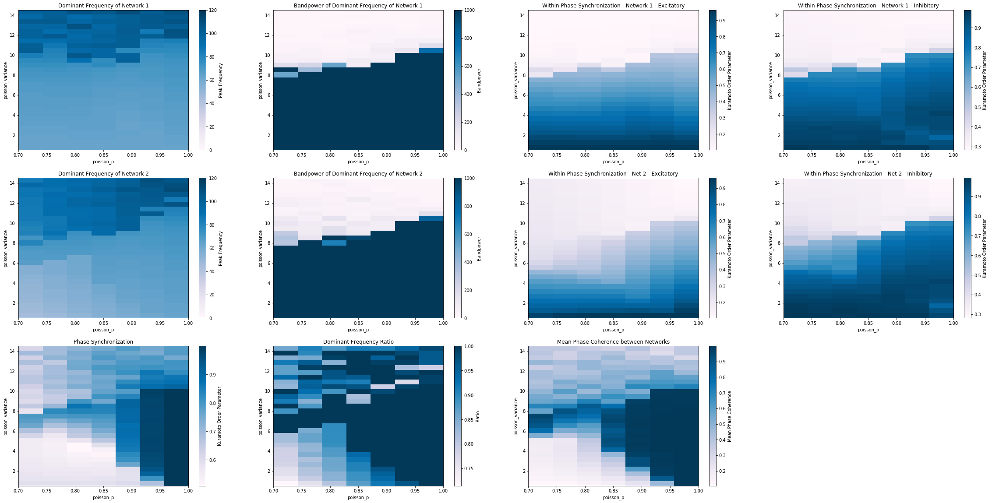

In [6]:
plots.plot_exploration(ex, vmin_ratio=None, vmin_phase=None, vmax_phase=None)

(<Figure size 720x792 with 12 Axes>,
 array([[<matplotlib.axes._subplots.AxesSubplot object at 0x12be55410>,
       dtype=object))

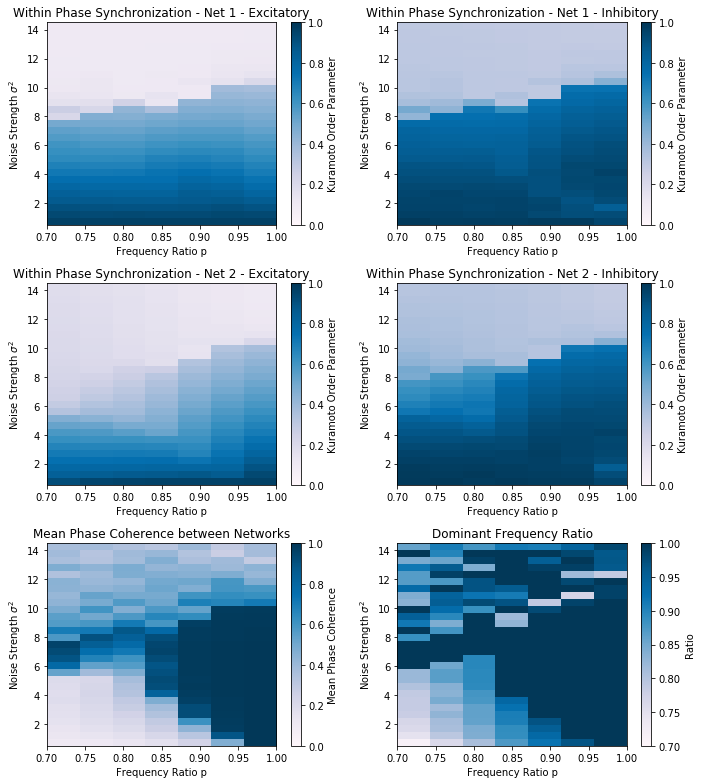

In [7]:
plots.plot_exp_figure(ex, vmin_ratio=0.7, vmin_phase=0.0, vmax_phase=1.0, filename="PING_a2a_exp")